# Variational Autoencoder for STL Objects

The goal of this notebook is to produce a Variational Autoencoder (VAE) that can encode and then decode Voxel objects.

This VAE is based off of the implementation demonstrated in [this YouTube video](https://www.youtube.com/watch?v=LtpU1yBStlU) [github link](https://github.com/ajbrock/Generative-and-Discriminative-Voxel-Modeling/blob/master/Generative/VAE.py). We refer to this VAE as the "Example VAE" in this notebook.

Another good example: https://github.com/hiranumn/DLmodels/blob/master/voxel_modeling/3D-Conv-VAE%20implementation%20(ModelNet%20Chair%20example).ipynb

## Notes

* We still use Thingi10k as our data source. Thingi10k's objects are stl files, so we employ methods explored in stl_voxelization.ipynb to convert each stl file to binvox (a voxel format).
* The Example VAE is written in python with theano and lasagne
* Lasagne's Glorot Uniform initializer \[[docs](https://lasagne.readthedocs.io/en/latest/modules/init.html)\] is the same as Xavier Uniform initializer (Tensorflow's API [docs](https://www.tensorflow.org/api_docs/python/tf/glorot_uniform_initializer)).
* The encoder uses conv3d layers and the decoder uses conv3d_transpose layers; TF describes [here] (https://www.tensorflow.org/api_docs/python/tf/nn/conv3d_transpose) that conv3d_transpose is the opposite of conv3d.

## Env Setup

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import time
import os

import matplotlib.pyplot as plt
%matplotlib inline

# autoreload modules
%load_ext autoreload
%autoreload 2

# set seeds for reproducibility
np.random.seed(12)
tf.set_random_seed(12)

## Data Import

In [2]:
# import data
import env
from data.thingi10k import Thingi10k
from data.stl import save_vectors_as_stl, plot_mesh
from data.voxels import plot_voxels
from models import MODEL_DIR


thingi = Thingi10k.init10k(pctile=.8)
# apply filter
#thingi.filter_by_id(1351747)
thingi.filter_by_tag('animal')
#thingi.filter_to_just_one()
#thingi = Thingi10k.init10()
#thingi = Thingi10k.init10(pctile=.1)
n_input = len(thingi)
n_input

109

In [6]:
class VariationalAutoencoder():
    
    def __init__(self, input_dim, latent_dim, learning_rate, keep_prob, verbose=False, 
                 kl_div_loss_weight=5, recon_loss_weight=5e-4, debug=False, ckpt_dir='voxel_vae'):
        """
        Args:
            kl_div_loss_weight: float, weight for KL Divergence loss when computing total loss
            recon_loss_weight: float, weight for reconstruction loss when computing total loss

        """
        # network and training params
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.learning_rate = learning_rate
        self.keep_prob = keep_prob
        self.verbose = verbose
        self.debug = debug
        self.kl_div_loss_weight = kl_div_loss_weight
        self.recon_loss_weight = recon_loss_weight
        
        self._input_x = tf.placeholder(tf.float32, shape=(None, self.input_dim, self.input_dim, self.input_dim, 1))
        self._keep_prob = tf.placeholder(dtype=tf.float32)
        self._trainable = tf.placeholder(dtype=tf.bool)

        # add ops to this list as a tuple with (<op name>, <op>) to see them executed, returned, and printed
        # to console during execution
        self._debug_ops = list()
        
        # Construct the TensorFlow Graph
        self.encoder, self.enc_mu, self.enc_sig = self._make_encoder(self._input_x, self._keep_prob, self._trainable)
        self.decoder = self._make_decoder(self.encoder, self._trainable)
        
        self.D_real, self.D_real_logits = self._discriminator(self._input_x, self._trainable)
        self.D_fake, self.D_fake_logits = self._discriminator(self.decoder, self._trainable)
        
        # VAE loss
        self.loss, self.optimizer, self.mean_recon, self.mean_kl = self._make_loss(self._input_x, self.decoder
                                                                                   , self.enc_mu, self.enc_sig)
        # GAN loss
        self.D_loss, self.G_loss, self.D_optim, self.G_optim = self._make_GAN_loss(self.D_real_logits, self.D_fake_logits)
    
    
        # Initializing the tensor flow variables
        init = tf.global_variables_initializer()
        
        # Setup Model Saving
        self.ckpt_dir = os.path.join(MODEL_DIR, ckpt_dir)
        self.saver = tf.train.Saver()
        self.recons_pre = list()
        self.recons_post = list()
        self.losses_kl_div = list()
        self.losses_recon = list()

        # Launch the session
        self.sess = tf.InteractiveSession()
        self.sess.run(init)
        
    def _print_shape(self, tensor, name=None):
        if self.verbose:
            if not name:
                name = tensor.name
            print('{}:'.format(name), tensor.shape)
        return
    
    def _make_encoder(self, input_x, keep_prob, trainable):
        
        with tf.variable_scope('encoder', reuse=tf.AUTO_REUSE):
            # tf conv3d: https://www.tensorflow.org/api_docs/python/tf/layers/conv3d
            # tf glorot init: https://www.tensorflow.org/api_docs/python/tf/glorot_uniform_initializer
            conv1 = tf.layers.batch_normalization(tf.layers.conv3d(input_x,
                                     filters=8,
                                     kernel_size=[3, 3, 3],
                                     strides=(1, 1, 1),
                                     padding='valid',
                                     activation=tf.nn.elu,
                                     kernel_initializer=tf.initializers.glorot_uniform()))
            self._print_shape(conv1)
            # the Example VAE specifies the activation functions as part of the layer
            # we specify the activation function as a seperate tensor
            # it is unknown if this is the preferred method in Tensorflow, but we know
            # it works from work in the 3D-VAE-GAN notebook
            # we also take advantage of batch_normalization
            # more info here:
            # https://medium.com/@ilango100/batch-normalization-speed-up-neural-network-training-245e39a62f85
            # with the hope that it gives speed without sacrificing quality
            # tf batch norm: https://www.tensorflow.org/api_docs/python/tf/layers/batch_normalization
            # tf elu (exponential linear unit): https://www.tensorflow.org/api_docs/python/tf/nn/elu

            conv2 = tf.layers.batch_normalization(tf.layers.conv3d(conv1,
                                     filters=16,
                                     kernel_size=[3, 3, 3],
                                     strides=(2, 2, 2),
                                     padding='same',
                                     activation=tf.nn.elu,
                                     kernel_initializer=tf.initializers.glorot_uniform()))
            self._print_shape(conv2)

            conv3 = tf.layers.batch_normalization(tf.layers.conv3d(conv2,
                                     filters=32,
                                     kernel_size=[3, 3, 3],
                                     strides=(1, 1, 1),
                                     padding='valid',
                                     activation=tf.nn.elu,
                                     kernel_initializer=tf.initializers.glorot_uniform()))
            self._print_shape(conv3)

            conv4 = tf.layers.batch_normalization(tf.layers.conv3d(conv3,
                                     filters=64,
                                     kernel_size=[3, 3, 3],
                                     strides=(2, 2, 2),
                                     padding='same',
                                     activation=tf.nn.elu,
                                     kernel_initializer=tf.initializers.glorot_uniform()))
            self._print_shape(conv4)

            # Apply one fully-connected layer after Conv3d layers
            # tf dense layer: https://www.tensorflow.org/api_docs/python/tf/layers/dense
            dense1 = tf.layers.batch_normalization(tf.layers.dense(conv4,
                                 units=343,
                                 activation=tf.nn.elu,
                                 kernel_initializer=tf.initializers.glorot_uniform()))
            self._print_shape(dense1)
            flatten = tf.layers.flatten(tf.nn.dropout(dense1, keep_prob))
        
            enc_mu = tf.layers.batch_normalization(tf.layers.dense(flatten,
                                 units=self.latent_dim,
                                 activation=None))
            self._print_shape(enc_mu)
            enc_sig = tf.layers.batch_normalization(tf.layers.dense(flatten,
                                 units=self.latent_dim,
                                 activation=None))
            self._print_shape(enc_sig)
                                                  
            # epsilon is a random draw from the latent space
            epsilon = tf.random_normal(tf.stack([tf.shape(dense1)[0], self.latent_dim]))
            self._print_shape(epsilon, 'epsilon')
            enc_z = enc_mu + tf.multiply(epsilon, tf.exp(enc_sig))
            self._print_shape(enc_z, 'z')
        return enc_z, enc_mu, enc_sig


        # apply dropout to prevent overtraining
        # why do we flatten?
        enc_output = tf.layers.flatten(tf.nn.dropout(network_output, keep_prob), name='enc_output')
        self._print_shape(enc_output)
        # transform the network output into the latent vector
        z_mu = tf.layers.dense(enc_output,
                         units=self.latent_dim,
                         # Example VAE does not use an initializer here
                         #kernel_initializer=tf.initializers.glorot_uniform(),
                         name='enc_mu')
        self._print_shape(z_mu)

        # Example VAE uses a custom layer to extract sigma
        # Here we borrow sigma calc from 3D-VAE-GAN
        z_sig = 0.5 * tf.layers.dense(enc_output, units=self.latent_dim, name='enc_sig')
        self._print_shape(z_sig, 'enc_sig')

        # epsilon is a random draw from the latent space
        epsilon = tf.random_normal(tf.stack([tf.shape(enc_output)[0], self.latent_dim]))
        self._print_shape(epsilon, 'epsilon')
        z = z_mu + tf.multiply(epsilon, tf.exp(z_sig))
        self._print_shape(z, 'z')

        return z, z_mu, z_sig
    
    def _make_decoder(self, input_z, trainable): ## generator
        
        # There is some magic in the Example VAE that adds conditional input based on the
        # class of the image. We do not have that luxury as we are attempting to do this
        # with input that lacks classes.
        # TODO: if poor results, try classes
        with tf.variable_scope('generator', reuse=tf.AUTO_REUSE):
            self._print_shape(input_z, 'input_z')

            # Why conv3d_transpose instead of conv3d?
            #
            # from https://www.tensorflow.org/api_docs/python/tf/nn/conv3d_transpose,
            #     "This operation is sometimes called "deconvolution" after Deconvolutional Networks,
            #      but is actually the transpose (gradient) of conv3d rather than an actual deconvolution."
            #
            # conv3d_transpose: https://www.tensorflow.org/api_docs/python/tf/layers/conv3d_transpose
            dense1 = tf.layers.dense(input_z,
                                     units=343,
                                     kernel_initializer=tf.initializers.glorot_uniform(),
                                     name='dec_dense1')
            self._print_shape(dense1)
            lrelu1 = tf.nn.elu(tf.layers.batch_normalization(dense1, training=trainable))
            self._print_shape(lrelu1)

            #z = tf.reshape(z, (-1, 1, 1, 1, n_latent))
            reshape_z = tf.reshape(lrelu1, shape=(-1, 7, 7, 7, 1), name='reshape_z')
            self._print_shape(reshape_z)
            #print('reshape_z: ', reshape_z.shape)
            #for value in reshape_z.shape:
            #    print(type(value))

            conv1 = tf.layers.conv3d_transpose(reshape_z,
                                               filters=64,
                                               kernel_size=[3, 3, 3],
                                               strides=(1, 1, 1),
                                               padding='same',
                                               # Example VAE does not mention bias
                                               use_bias=False,
                                               kernel_initializer=tf.initializers.glorot_uniform(),
                                               name='dec_conv1')
            self._print_shape(conv1)
            lrelu2 = tf.nn.elu(tf.layers.batch_normalization(conv1, training=trainable), name='dec_lrelu2')
            self._print_shape(lrelu2)

            conv2 = tf.layers.conv3d_transpose(lrelu2,
                                               filters=32,
                                               kernel_size=[3, 3, 3],
                                               # Example VAE used .5 stride values, but Tensorflow complains
                                               # of being forced to use a float value here
                                               #strides=(1.0 / 2, 1.0 / 2, 1.0 / 2),
                                               strides=(2, 2, 2),
                                               padding='valid',
                                               use_bias=False,
                                               kernel_initializer=tf.initializers.glorot_uniform(),
                                               name='dec_conv2')
            self._print_shape(conv2)
            lrelu3 = tf.nn.elu(tf.layers.batch_normalization(conv2, training=trainable), name='dec_lrelu3')
            self._print_shape(lrelu3)

            conv3 = tf.layers.conv3d_transpose(lrelu3,
                                               filters=16,
                                               kernel_size=[3, 3, 3],
                                               strides=(1, 1, 1),
                                               # changed to valid to hit correct dimension
                                               padding='same',
                                               use_bias=False,
                                               kernel_initializer=tf.initializers.glorot_uniform(),
                                               name='dec_conv3')
            self._print_shape(conv3)
            lrelu4 = tf.nn.elu(tf.layers.batch_normalization(conv3, training=trainable), name='dec_lrelu4')
            self._print_shape(lrelu4)

            conv4 = tf.layers.conv3d_transpose(lrelu4,
                                               filters=8,
                                               kernel_size=[4, 4, 4],
                                               #strides=(1.0 / 2, 1.0 / 2, 1.0 / 2),
                                               strides=(2, 2, 2),
                                               padding='valid',
                                               use_bias=False,
                                               kernel_initializer=tf.initializers.glorot_uniform(),
                                               name='dec_conv4')
            self._print_shape(conv4)
            lrelu5 = tf.nn.elu(tf.layers.batch_normalization(conv4, training=trainable), name='dec_lrelu5')
            self._print_shape(lrelu5)

            conv5 = tf.layers.conv3d_transpose(lrelu5,
                                               filters=1,
                                               kernel_size=[3, 3, 3],
                                               strides=(1, 1, 1),
                                               padding='same',
                                               use_bias=False,
                                               kernel_initializer=tf.initializers.glorot_uniform(),
                                               name='dec_conv5')
            self._print_shape(conv5)
            #decoded_output = tf.nn.tanh(conv5)
            decoded_output = tf.nn.sigmoid(conv5)
            #decoded_output = tf.clip_by_value(decoded_output, 1e-7, 1.0 - 1e-7)
            #self._add_debug_op('max decoded_output', tf.math.reduce_max(decoded_output), False)
            #self._add_debug_op('min decoded_output', tf.math.reduce_min(decoded_output), False)
            #self._add_debug_op('mean decoded_output', tf.math.reduce_mean(decoded_output), False)
            #decoded_output = conv5
            self._print_shape(decoded_output)

        return decoded_output
    
    ## add discriminator, GAN
    def _discriminator(self, input_x, trainable):
        # need to clip the values?
        self._print_shape(input_x, 'input_x')

        with tf.variable_scope('discriminator', reuse=tf.AUTO_REUSE):

            # 1st hidden layer
            conv1 = tf.layers.conv3d(input_x, 128, [3, 3, 3], strides=(2, 2, 2), padding='same', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
            lrelu1 = tf.nn.elu(conv1)
            self._print_shape(lrelu1)
            # 2nd hidden layer
            conv2 = tf.layers.conv3d(lrelu1, 256, [3, 3, 3], strides=(2, 2, 2), padding='same', use_bias=False,
                                    kernel_initializer=tf.contrib.layers.xavier_initializer())
            lrelu2 = tf.nn.elu(tf.layers.batch_normalization(conv2, training=trainable))
            self._print_shape(lrelu2)
            # 3rd hidden layer
            conv3 = tf.layers.conv3d(lrelu2, 512, [3, 3, 3], strides=(2, 2, 2), padding='same', use_bias=False,
                                    kernel_initializer=tf.contrib.layers.xavier_initializer())
            lrelu3 = tf.nn.elu(tf.layers.batch_normalization(conv3, training=trainable))
            self._print_shape(lrelu3)
            # output layer
            #conv4 = tf.layers.conv3d(lrelu3, 1, [4, 4, 4], strides=(1, 1, 1), padding='valid', use_bias=False,
            #                          kernel_initializer=tf.contrib.layers.xavier_initializer())
            conv4 = tf.layers.conv3d(lrelu3, 1, [3, 3, 3], strides=(1, 1, 1), padding='valid', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
            o = tf.nn.sigmoid(conv4)
            self._print_shape(conv4)
            self._print_shape(o)
            
        return o, conv4
    
    
    
    def _make_loss(self, enc_input, dec_output, z_mu, z_sig):
        """
        Info on loss in VAE:
          * https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
          
        Args:
            enc_input: tensor, input tensor into VAE
            dec_output: tensor, decoded output tensor from VAE

        Return:
            float, 
        """
        
        # Weighted binary cross-entropy for use in voxel loss. Allows weighting of false positives relative to false negatives.
        # Nominally set to strongly penalize false negatives
        # we must clip because values of 0 or 1 will cause errors
        #clipped_input = tf.clip_by_value(tf.nn.sigmoid(enc_input), 1e-7, 1.0 - 1e-7)
        clipped_input = tf.clip_by_value(enc_input, 1e-7, 1.0 - 1e-7)
        clipped_output = tf.clip_by_value(dec_output, 1e-7, 1.0 - 1e-7)
        #self._add_debug_op('max clipped_input', tf.math.reduce_max(clipped_input), False)
        #self._add_debug_op('min clipped_input', tf.math.reduce_min(clipped_input), False)
        #self._add_debug_op('mean clipped_input', tf.math.reduce_mean(clipped_input), False)
        self._add_debug_op('max clipped_output', tf.math.reduce_max(clipped_output), False)
        self._add_debug_op('min clipped_output', tf.math.reduce_min(clipped_output), False)
        self._add_debug_op('mean clipped_output', tf.math.reduce_mean(clipped_output), False)
        bce = -(98.0 * clipped_input * tf.log(clipped_output) + 2.0 * (1.0 - clipped_input) * tf.log(1.0 - clipped_output)) / 100.0
        #self._add_debug_op('bce', bce, False)
        #bce = tf.keras.backend.binary_crossentropy(enc_output, dec_output)
        
        # Voxel-Wise Reconstruction Loss 
        # Note that the output values are clipped to prevent the BCE from evaluating log(0).
        recon_loss = tf.reduce_mean(bce, 1)
   
        #recon_loss = tf.reduce_sum(tf.squared_difference(
        #    tf.reshape(dec_output, (-1, self.input_dim ** 3)),
        #    tf.reshape(self._input_x, (-1, self.input_dim ** 3))), 1)
        
        kl_divergence = -0.5 * tf.reduce_sum(1.0 + 2.0 * z_sig - z_mu ** 2 - tf.exp(2.0 * z_sig), 1)

        mean_kl = tf.reduce_sum(kl_divergence)
        #self._add_debug_op('mean_kl', mean_kl, False)
        mean_recon = tf.reduce_sum(recon_loss)
        #self._add_debug_op('mean_recon', mean_recon, False)

        # tf reduce_mean: https://www.tensorflow.org/api_docs/python/tf/math/reduce_mean
        loss = tf.reduce_mean(self.kl_div_loss_weight * kl_divergence + self.recon_loss_weight * recon_loss)
        #self._add_debug_op('loss', loss, False)
        # remove kl for fun
        #loss = tf.reduce_mean(self.recon_loss_weight * recon_loss)
        
        #optimizer = tf.train.AdamOptimizer(learning_rate=self.learning_rate).minimize(loss)
        optimizer = tf.train.MomentumOptimizer(learning_rate=self.learning_rate, momentum=0.9, use_nesterov=True).minimize(loss)

        return loss, optimizer, mean_recon, mean_kl
    
    def _make_GAN_loss(self, D_real_logits, D_fake_logits):

        D_loss_real = tf.reduce_mean(D_real_logits)
        D_loss_fake = tf.reduce_mean(D_fake_logits)
        D_loss = D_loss_real - D_loss_fake
        G_loss = -tf.reduce_mean(D_fake_logits)
        
        D_optim = tf.train.RMSPropOptimizer(learning_rate=self.learning_rate).minimize(-D_loss)
        G_optim = tf.train.RMSPropOptimizer(learning_rate=self.learning_rate).minimize(G_loss)
        
        return D_loss, G_loss, D_optim, G_optim


    def _add_debug_op(self, name, op, newline=True):
        self._debug_ops.append((name, op, newline))
        return

    def _print_debug_ops(self, results):
        if self.debug:
            for i, debug_op in enumerate(self._debug_ops):
                msg = 'DEBUG_OP "{}": '.format(debug_op[0])
                if len(debug_op) > 2 and debug_op[2]:
                    msg += '\n'
                msg += '{}'.format(results[i])
                print(msg)
        return

    def train(self, generator, epochs=10, input_repeats=1, display_step=1, save_step=1, viz_data=None):
        
        start = time.time()
        for epoch_num, epoch in enumerate(range(epochs)):

            for batch_num, batch in enumerate(generator()):
                
                if self.verbose:
                    print('Epoch: {}, Batch: {}, Elapsed time: {:.2f} mins'.format(epoch_num, batch_num, (time.time() - start) / 60))
                #print("batch.min()", batch.min())
                #print("batch.max()", batch.max())
                # repeat for extra practice on each shape
                for _ in range(input_repeats):

#                     sess.run(self.D_optim, feed_dict={x_encoder_in: batch, x_discr_in: batch, keep_prob: 0.8, isTrain: True})
#                     sess.run(clip)

                    ops = tuple([self.optimizer, self.loss, self.mean_kl, self.mean_recon
                                 , self.D_loss, self.G_loss, self.D_optim, self.G_optim] + 
                                [op for name, op, _ in self._debug_ops])
                    results = self.sess.run(
                        ops,
                        feed_dict={self._input_x: batch, self._keep_prob:self.keep_prob, self._trainable: True}
                    )
                    _, loss, kl_divergence, recon_loss, D_loss, G_loss, _, _ = results[:8]
                    self._print_debug_ops(results[8:])                   
                    
                    
                if self.verbose:
                    #print('\tKL Divergence = {:.5f}, Reconstruction Loss = {:.5f}'.format(kl_divergence, recon_loss))
                    print('\tKL Divergence = {}, Reconstruction Loss = {}, -D_loss = {}, G_loss = {}'.format(kl_divergence
                                                                                                , recon_loss, -D_loss, G_loss))
                
            if (epoch + 1) % display_step == 0:
                print("Epoch: {}, ".format(epoch + 1) + 
                      "Loss = {:.5f}, ".format(loss) + 
                      "KL Divergence = {:.5f}, ".format(kl_divergence) +
                      "Reconstruction Loss = {:.5f}, ".format(recon_loss) +
                      "-D_Loss = {:.5f}, ".format(-D_loss) +
                      "G_Loss = {:.5f}, ".format(G_loss) +
                      "Elapsed time: {:.2f} mins".format((time.time() - start) / 60))
                print('Generation Example:')
                
                # prepare for generation
                #print(batch[0][0])
                if viz_data is None:
                    viz_data = batch[0]
                self._print_shape(viz_data, 'Example shape (before reshape)')
                recon_input = np.reshape(viz_data, (1, self.input_dim, self.input_dim, self.input_dim, 1))
                self._print_shape(recon_input, 'Example shape')
                
                # generate!
                recon = self.reconstruct(recon_input)
                self._print_shape(recon, 'Recon')

                # prepare for plotting
                recon_input = np.reshape(recon_input, (self.input_dim, self.input_dim, self.input_dim))
                self._print_shape(recon_input, 'Example shape (for plotting)')
                recon = np.reshape(recon, (self.input_dim, self.input_dim, self.input_dim))
                self._print_shape(recon, 'Recon (for plotting)')
                # network outputs decimals; here we force them to True/False for plotting
                self.recons_pre.append(recon)
                recon = recon > 0.5
                self.recons_post.append(recon)
                # replace all nans with zeros
                #recon = np.nan_to_num(recon)
                
                # save the generated object in case we wish to review later
                path = os.path.join(self.ckpt_dir, 'recon_epoch-{}.npy'.format(epoch))

                # visualize
                self.visualize_reconstruction(recon_input, recon)

            if (epoch + 1) % save_step == 0:
                # Save the variables to disk.
                save_path = self.saver.save(self.sess, os.path.join(self.ckpt_dir, "model_epoch-{}.ckpt".format(epoch)))

                print("Model saved in path: {}".format(save_path))
                                       
        return

    def restore(self, model_ckpt):
        self.saver.restore(self.sess, model_ckpt)
        return
    
    def close(self):
        self.sess.close()
        return
            
    def reconstruct(self, input_x):
        """
        Use VAE to reconstruct given data
        """
        ops = tuple([self.decoder] + [op for name, op, _ in self._debug_ops])
                    
        results = self.sess.run(ops, 
            feed_dict={self._input_x: input_x, self._keep_prob: 1.0, self._trainable: False})
        
        decoded = results[0]
        self._print_debug_ops(results[1:])
                    
        return decoded
    
    def visualize_reconstruction(self, original_x, reconstructed_x, name=None):
        title = '' if not name else ': {}'.format(name)
        plot_voxels(original_x, title='Original' + title)
        plot_voxels(reconstructed_x, title='Autoencoded' + title)
        return

    def __repr__(self):
        return '<VariationalAutoencoder(input_dim={}, latent_dim={}, learning_rate={}, keep_prob={})>'.format(
            self.input_dim, self.latent_dim, self.learning_rate, self.keep_prob)


## Training

The model is having issues producing an output that is recognizable.

Experiments:
* Large & small datasets produce the same result
* latent_dim variations have no effect
* Too high of a learning rate causes the loss to go down then up and sometimes fluctuate
* Removing dropout (keep_prob=1.0) with lr=0.00001 on a single training example causes loss to go down as expected but output is still not recognizable
* Upping recon_loss_weight seems to cause more variation in decoded output
* Severe upping of recon_loss_weight (recon=5, kl=5e-4) delivered loss of ~5 after 500 epochs on a single training example with 20 input_repeats
* 500 epochs with above settings and RMSPropOptimizer achieved loss of <1 after about 200 epochs; viz still unimpressive
* Increasing recon_loss_weight to 5e5 and dumping recon loss and kl divergence values reveals that recon loss is diminishing. Question: what is the input to recon loss? an array of 1s and 0s or TRUEs and FALSEs? A: 1s and 0s
* Using weight binary cross entropy for recon loss as according to Example VAE shows same loss reduction pattern with still unimpressive recon
* Equalized loss weights yielded no change (at 100 epochs on one square example with 50 input_repeats, viz was all 1s)
* By dumping out counts of True vs False of each recon, I can see that False goes down while True goes up to the point where they are almost all Trues after 50 epochs
* Run through all training examples produces loss of nan
* Added homebaked debug_ops and discovered that the dec_output is nan and not the loss functions!

Num input = 109
Num batches per epoch = 4.95


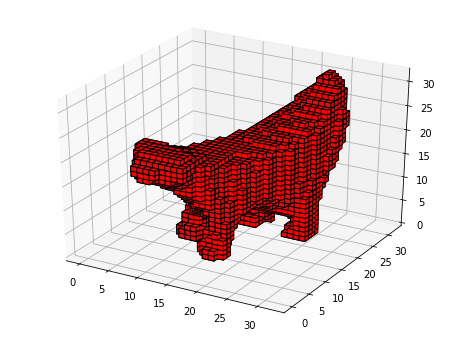

In [23]:
VOXELS_DIM = 32
BATCH_SIZE = 22
print('Num input = {}'.format(n_input))
print('Num batches per epoch = {:.2f}'.format(n_input / BATCH_SIZE))
training_example = thingi.get_voxels(VOXELS_DIM, stl_file=thingi.get_stl_path(stl_id=101902))
plot_voxels(training_example)

encoder/batch_normalization/batchnorm/add_1:0: (?, 30, 30, 30, 8)
encoder/batch_normalization_1/batchnorm/add_1:0: (?, 15, 15, 15, 16)
encoder/batch_normalization_2/batchnorm/add_1:0: (?, 13, 13, 13, 32)
encoder/batch_normalization_3/batchnorm/add_1:0: (?, 7, 7, 7, 64)
encoder/batch_normalization_4/batchnorm/add_1:0: (?, 7, 7, 7, 343)
encoder/batch_normalization_5/batchnorm/add_1:0: (?, 100)
encoder/batch_normalization_6/batchnorm/add_1:0: (?, 100)
epsilon: (?, 100)
z: (?, 100)
input_z: (?, 100)
generator/dec_dense1/BiasAdd:0: (?, 343)
generator/Elu:0: (?, 343)
generator/reshape_z:0: (?, 7, 7, 7, 1)
generator/dec_conv1/conv3d_transpose:0: (?, 7, 7, 7, 64)
generator/dec_lrelu2:0: (?, 7, 7, 7, 64)
generator/dec_conv2/conv3d_transpose:0: (?, 15, 15, 15, 32)
generator/dec_lrelu3:0: (?, 15, 15, 15, 32)
generator/dec_conv3/conv3d_transpose:0: (?, 15, 15, 15, 16)
generator/dec_lrelu4:0: (?, 15, 15, 15, 16)
generator/dec_conv4/conv3d_transpose:0: (?, 32, 32, 32, 8)
generator/dec_lrelu5:0: (?, 

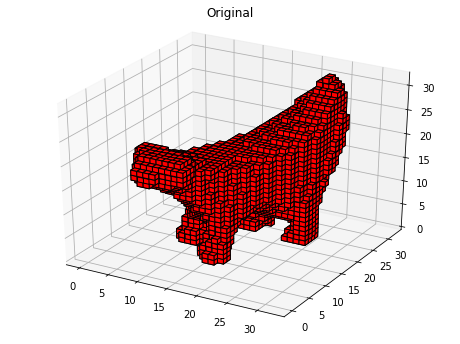

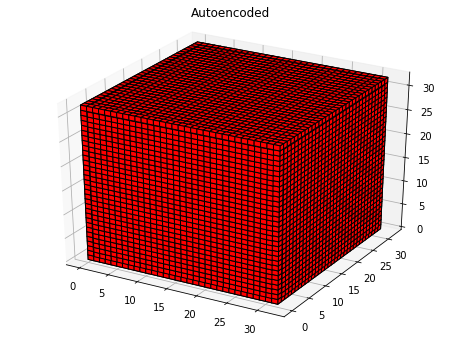

Epoch: 1, Batch: 0, Elapsed time: 0.80 mins
DEBUG_OP "max clipped_output": 0.9999982118606567
DEBUG_OP "min clipped_output": 0.17232178151607513
DEBUG_OP "mean clipped_output": 0.8561910390853882
	KL Divergence = 27.259033203125, Reconstruction Loss = 1203.440673828125, -D_loss = 0.21543645858764648, G_loss = -1.7283836603164673
Epoch: 1, Batch: 1, Elapsed time: 0.97 mins
DEBUG_OP "max clipped_output": 0.9999991655349731
DEBUG_OP "min clipped_output": 0.16198305785655975
DEBUG_OP "mean clipped_output": 0.8520376086235046
	KL Divergence = 31.89736557006836, Reconstruction Loss = 1251.828125, -D_loss = 0.30646371841430664, G_loss = -2.219468832015991
Epoch: 1, Batch: 2, Elapsed time: 1.15 mins
DEBUG_OP "max clipped_output": 0.9999929666519165
DEBUG_OP "min clipped_output": 0.16112454235553741
DEBUG_OP "mean clipped_output": 0.8421879410743713
	KL Divergence = 39.25394821166992, Reconstruction Loss = 1186.5062255859375, -D_loss = 0.5759806632995605, G_loss = -2.618337392807007
Epoch: 1, B

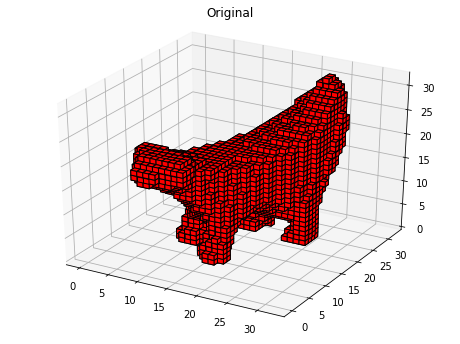

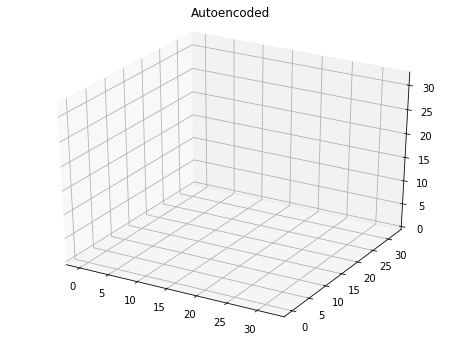

Epoch: 2, Batch: 0, Elapsed time: 1.53 mins
DEBUG_OP "max clipped_output": 0.9999794960021973
DEBUG_OP "min clipped_output": 0.13335053622722626
DEBUG_OP "mean clipped_output": 0.7603067755699158
	KL Divergence = 142.2338409423828, Reconstruction Loss = 1009.1483154296875, -D_loss = 0.892507791519165, G_loss = -4.100731372833252
Epoch: 2, Batch: 1, Elapsed time: 1.68 mins
DEBUG_OP "max clipped_output": 0.9999915361404419
DEBUG_OP "min clipped_output": 0.07851548492908478
DEBUG_OP "mean clipped_output": 0.6983036398887634
	KL Divergence = 142.4329833984375, Reconstruction Loss = 1101.382080078125, -D_loss = 1.7159740924835205, G_loss = -5.1860480308532715
Epoch: 2, Batch: 2, Elapsed time: 1.84 mins
DEBUG_OP "max clipped_output": 0.9999215602874756
DEBUG_OP "min clipped_output": 0.10194606333971024
DEBUG_OP "mean clipped_output": 0.7081131339073181
	KL Divergence = 115.52676391601562, Reconstruction Loss = 1058.893310546875, -D_loss = 2.0082671642303467, G_loss = -5.612026214599609
Epoch

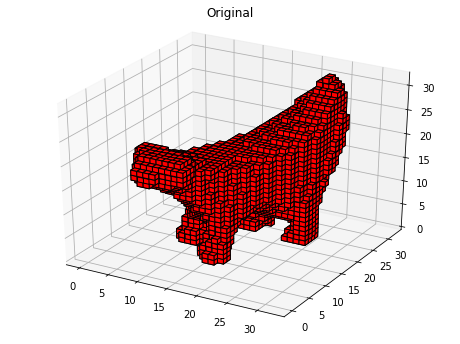

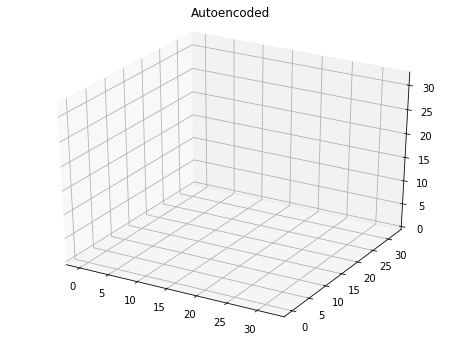

Epoch: 3, Batch: 0, Elapsed time: 2.23 mins
DEBUG_OP "max clipped_output": 0.9999951124191284
DEBUG_OP "min clipped_output": 0.11824589967727661
DEBUG_OP "mean clipped_output": 0.7527225017547607
	KL Divergence = 87.44575500488281, Reconstruction Loss = 997.5526733398438, -D_loss = 1.7672953605651855, G_loss = -6.848270893096924
Epoch: 3, Batch: 1, Elapsed time: 2.41 mins
DEBUG_OP "max clipped_output": 0.9999850988388062
DEBUG_OP "min clipped_output": 0.08753254264593124
DEBUG_OP "mean clipped_output": 0.7563269138336182
	KL Divergence = 119.38796997070312, Reconstruction Loss = 1089.833251953125, -D_loss = 2.3242740631103516, G_loss = -7.498451232910156
Epoch: 3, Batch: 2, Elapsed time: 2.56 mins
DEBUG_OP "max clipped_output": 0.9998281002044678
DEBUG_OP "min clipped_output": 0.16465134918689728
DEBUG_OP "mean clipped_output": 0.7838280200958252
	KL Divergence = 102.1370849609375, Reconstruction Loss = 1059.4854736328125, -D_loss = 2.421051502227783, G_loss = -7.727691650390625
Epoch:

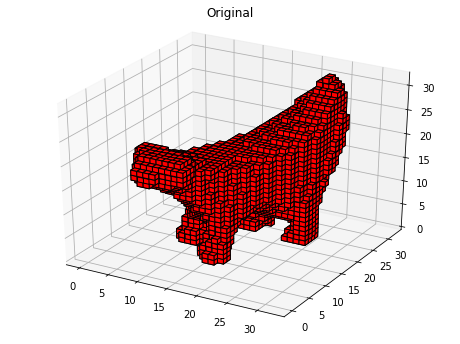

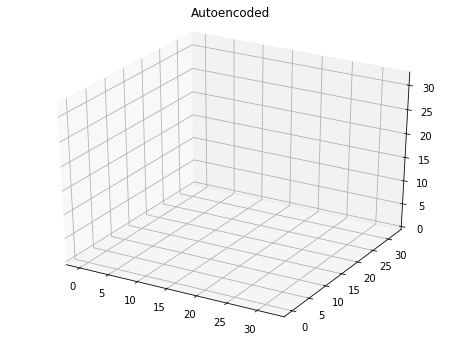

Epoch: 4, Batch: 0, Elapsed time: 2.92 mins
DEBUG_OP "max clipped_output": 0.999859094619751
DEBUG_OP "min clipped_output": 0.1811307817697525
DEBUG_OP "mean clipped_output": 0.7925438284873962
	KL Divergence = 40.701297760009766, Reconstruction Loss = 991.9917602539062, -D_loss = 1.7931818962097168, G_loss = -8.89871597290039
Epoch: 4, Batch: 1, Elapsed time: 3.08 mins
DEBUG_OP "max clipped_output": 0.9998795986175537
DEBUG_OP "min clipped_output": 0.13852199912071228
DEBUG_OP "mean clipped_output": 0.7630342245101929
	KL Divergence = 25.059871673583984, Reconstruction Loss = 1074.7901611328125, -D_loss = 3.116394519805908, G_loss = -10.13082218170166
Epoch: 4, Batch: 2, Elapsed time: 3.23 mins
DEBUG_OP "max clipped_output": 0.9998083710670471
DEBUG_OP "min clipped_output": 0.17621111869812012
DEBUG_OP "mean clipped_output": 0.7679533362388611
	KL Divergence = 21.978515625, Reconstruction Loss = 1025.140869140625, -D_loss = 3.5542173385620117, G_loss = -10.698540687561035
Epoch: 4, Ba

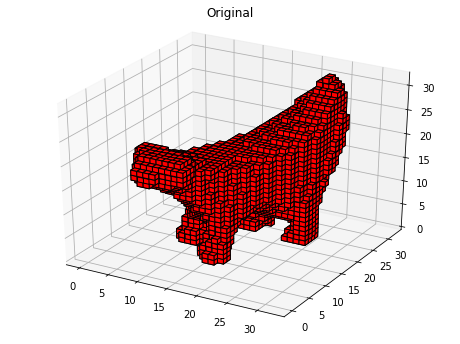

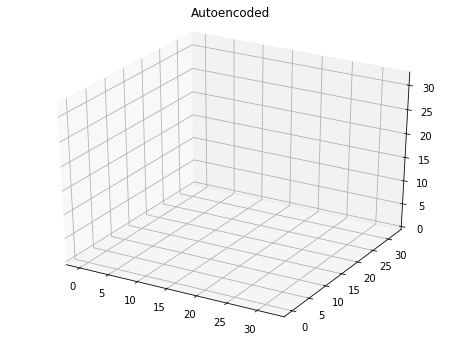

Epoch: 5, Batch: 0, Elapsed time: 3.64 mins
DEBUG_OP "max clipped_output": 0.9997770190238953
DEBUG_OP "min clipped_output": 0.14755718410015106
DEBUG_OP "mean clipped_output": 0.7678905725479126
	KL Divergence = 115.98060607910156, Reconstruction Loss = 941.9415893554688, -D_loss = 2.797595977783203, G_loss = -12.078482627868652
Epoch: 5, Batch: 1, Elapsed time: 3.78 mins
DEBUG_OP "max clipped_output": 0.9998655319213867
DEBUG_OP "min clipped_output": 0.11256259679794312
DEBUG_OP "mean clipped_output": 0.7370500564575195
	KL Divergence = 102.30900573730469, Reconstruction Loss = 1050.7364501953125, -D_loss = 4.379722595214844, G_loss = -13.374629974365234
Epoch: 5, Batch: 2, Elapsed time: 3.93 mins
DEBUG_OP "max clipped_output": 0.9998941421508789
DEBUG_OP "min clipped_output": 0.13840743899345398
DEBUG_OP "mean clipped_output": 0.7497040033340454
	KL Divergence = 130.18695068359375, Reconstruction Loss = 971.5271606445312, -D_loss = 4.817080497741699, G_loss = -13.932947158813477
Epo

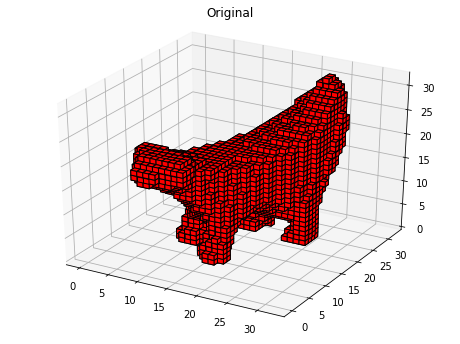

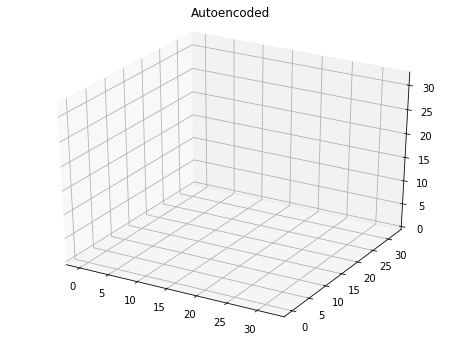

Epoch: 6, Batch: 0, Elapsed time: 4.30 mins
DEBUG_OP "max clipped_output": 0.9998188614845276
DEBUG_OP "min clipped_output": 0.1289285123348236
DEBUG_OP "mean clipped_output": 0.7412513494491577
	KL Divergence = 441.283447265625, Reconstruction Loss = 934.3636474609375, -D_loss = 3.7248029708862305, G_loss = -15.330347061157227
Epoch: 6, Batch: 1, Elapsed time: 4.44 mins
DEBUG_OP "max clipped_output": 0.9997733235359192
DEBUG_OP "min clipped_output": 0.11776002496480942
DEBUG_OP "mean clipped_output": 0.7330533862113953
	KL Divergence = 174.72998046875, Reconstruction Loss = 980.197509765625, -D_loss = 5.417292594909668, G_loss = -16.535720825195312
Epoch: 6, Batch: 2, Elapsed time: 4.60 mins
DEBUG_OP "max clipped_output": 0.9997759461402893
DEBUG_OP "min clipped_output": 0.12397120893001556
DEBUG_OP "mean clipped_output": 0.7276744842529297
	KL Divergence = 157.26271057128906, Reconstruction Loss = 973.9129638671875, -D_loss = 6.102107048034668, G_loss = -17.319625854492188
Epoch: 6, 

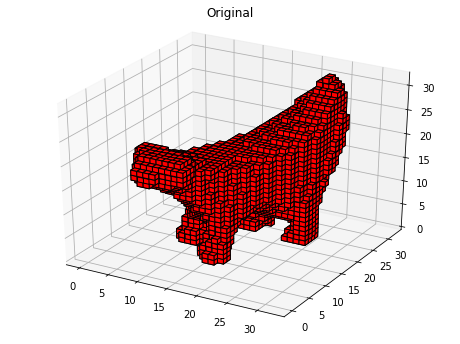

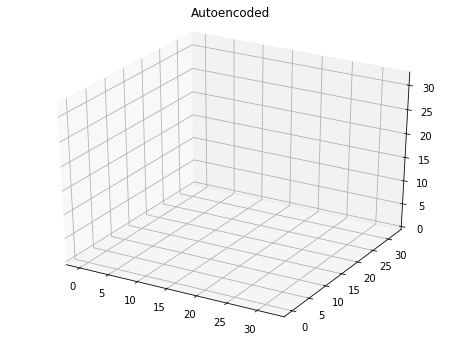

Epoch: 7, Batch: 0, Elapsed time: 4.96 mins
DEBUG_OP "max clipped_output": 0.9998775720596313
DEBUG_OP "min clipped_output": 0.11919824779033661
DEBUG_OP "mean clipped_output": 0.7319732904434204
	KL Divergence = 239.31387329101562, Reconstruction Loss = 859.487060546875, -D_loss = 4.105443954467773, G_loss = -18.14876365661621
Epoch: 7, Batch: 1, Elapsed time: 5.11 mins
DEBUG_OP "max clipped_output": 0.9999927282333374
DEBUG_OP "min clipped_output": 0.09085588157176971
DEBUG_OP "mean clipped_output": 0.7024450302124023
	KL Divergence = 227.67225646972656, Reconstruction Loss = 987.907958984375, -D_loss = 6.141596794128418, G_loss = -19.48749542236328
Epoch: 7, Batch: 2, Elapsed time: 5.26 mins
DEBUG_OP "max clipped_output": 0.9999618530273438
DEBUG_OP "min clipped_output": 0.12866732478141785
DEBUG_OP "mean clipped_output": 0.7294099926948547
	KL Divergence = 261.93475341796875, Reconstruction Loss = 942.2745971679688, -D_loss = 6.673956871032715, G_loss = -20.081531524658203
Epoch: 7

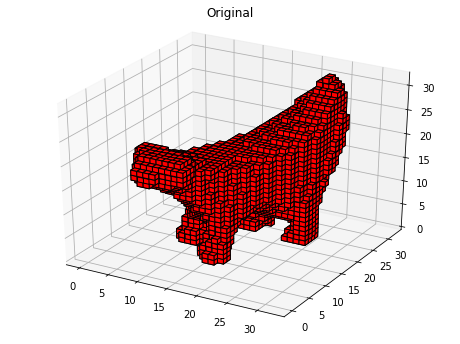

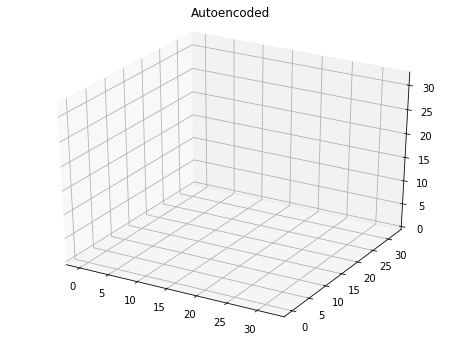

Epoch: 8, Batch: 0, Elapsed time: 5.61 mins
DEBUG_OP "max clipped_output": 0.9998533725738525
DEBUG_OP "min clipped_output": 0.1603321135044098
DEBUG_OP "mean clipped_output": 0.7491115927696228
	KL Divergence = 337.922607421875, Reconstruction Loss = 856.8934326171875, -D_loss = 4.578985214233398, G_loss = -21.1461181640625
Epoch: 8, Batch: 1, Elapsed time: 5.77 mins
DEBUG_OP "max clipped_output": 0.999788224697113
DEBUG_OP "min clipped_output": 0.11488378047943115
DEBUG_OP "mean clipped_output": 0.71500563621521
	KL Divergence = 301.408447265625, Reconstruction Loss = 972.0238037109375, -D_loss = 7.272748947143555, G_loss = -22.91117286682129
Epoch: 8, Batch: 2, Elapsed time: 5.92 mins
DEBUG_OP "max clipped_output": 0.999972939491272
DEBUG_OP "min clipped_output": 0.1331227719783783
DEBUG_OP "mean clipped_output": 0.7216215133666992
	KL Divergence = 347.8692626953125, Reconstruction Loss = 888.8978271484375, -D_loss = 7.541449546813965, G_loss = -23.16974639892578
Epoch: 8, Batch: 3,

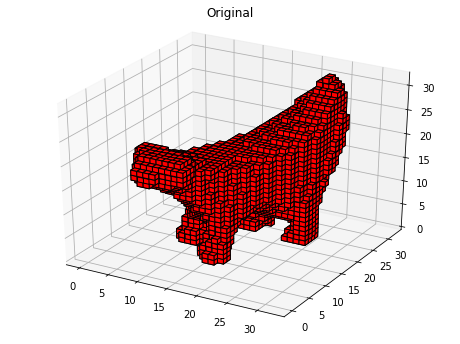

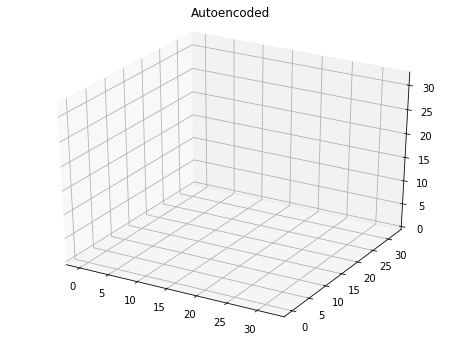

Epoch: 9, Batch: 0, Elapsed time: 6.28 mins
DEBUG_OP "max clipped_output": 0.9996424913406372
DEBUG_OP "min clipped_output": 0.11487842351198196
DEBUG_OP "mean clipped_output": 0.721240758895874
	KL Divergence = 755.0013427734375, Reconstruction Loss = 999.7432861328125, -D_loss = 5.799221038818359, G_loss = -24.90754508972168
Epoch: 9, Batch: 1, Elapsed time: 6.43 mins
DEBUG_OP "max clipped_output": 0.9999048709869385
DEBUG_OP "min clipped_output": 0.15866440534591675
DEBUG_OP "mean clipped_output": 0.7577183246612549
	KL Divergence = 518.3519897460938, Reconstruction Loss = 962.212158203125, -D_loss = 6.556394577026367, G_loss = -24.492168426513672
Epoch: 9, Batch: 2, Elapsed time: 6.59 mins
DEBUG_OP "max clipped_output": 0.999796450138092
DEBUG_OP "min clipped_output": 0.1758040338754654
DEBUG_OP "mean clipped_output": 0.7596772909164429
	KL Divergence = 402.3297424316406, Reconstruction Loss = 909.5368041992188, -D_loss = 7.384611129760742, G_loss = -25.244373321533203
Epoch: 9, Ba

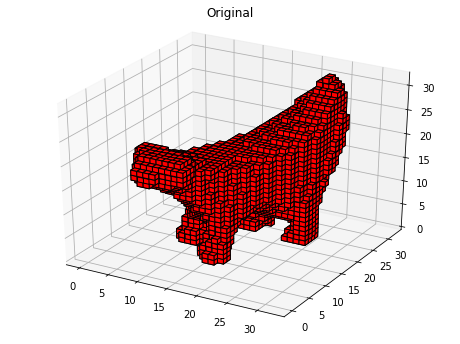

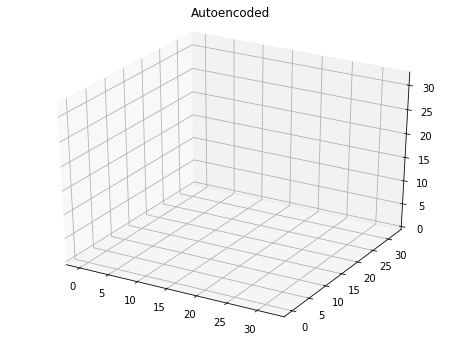

Epoch: 10, Batch: 0, Elapsed time: 6.95 mins
DEBUG_OP "max clipped_output": 0.9998393058776855
DEBUG_OP "min clipped_output": 0.11645308881998062
DEBUG_OP "mean clipped_output": 0.7053232192993164
	KL Divergence = 659.5765380859375, Reconstruction Loss = 790.5240478515625, -D_loss = 3.953218460083008, G_loss = -25.556543350219727
Epoch: 10, Batch: 1, Elapsed time: 7.10 mins
DEBUG_OP "max clipped_output": 0.9999783039093018
DEBUG_OP "min clipped_output": 0.05552566796541214
DEBUG_OP "mean clipped_output": 0.6663143634796143
	KL Divergence = 1034.1712646484375, Reconstruction Loss = 900.9385986328125, -D_loss = 8.073827743530273, G_loss = -28.307401657104492
Epoch: 10, Batch: 2, Elapsed time: 7.27 mins
DEBUG_OP "max clipped_output": 0.9999727010726929
DEBUG_OP "min clipped_output": 0.06423875689506531
DEBUG_OP "mean clipped_output": 0.6643474102020264
	KL Divergence = 2145.77099609375, Reconstruction Loss = 852.8743896484375, -D_loss = 8.771175384521484, G_loss = -28.85248565673828
Epoch

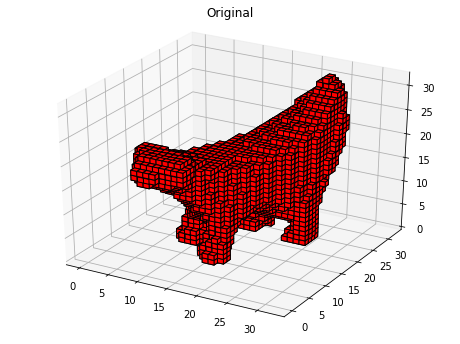

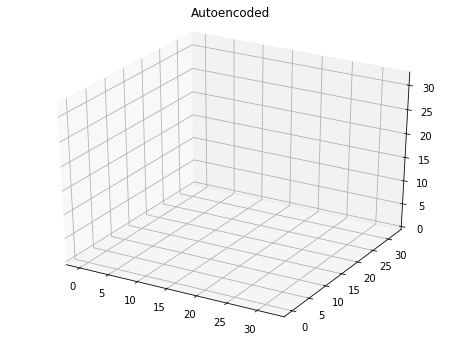

Epoch: 11, Batch: 0, Elapsed time: 7.62 mins
DEBUG_OP "max clipped_output": 0.9999828338623047
DEBUG_OP "min clipped_output": 0.05310392752289772
DEBUG_OP "mean clipped_output": 0.6543856263160706
	KL Divergence = 915.974853515625, Reconstruction Loss = 740.1351318359375, -D_loss = 4.29791259765625, G_loss = -28.422508239746094
Epoch: 11, Batch: 1, Elapsed time: 7.77 mins
DEBUG_OP "max clipped_output": 0.9999890327453613
DEBUG_OP "min clipped_output": 0.03778168186545372
DEBUG_OP "mean clipped_output": 0.6447672247886658
	KL Divergence = 363.41900634765625, Reconstruction Loss = 849.9817504882812, -D_loss = 8.484289169311523, G_loss = -31.007518768310547
Epoch: 11, Batch: 2, Elapsed time: 7.92 mins
DEBUG_OP "max clipped_output": 0.999982476234436
DEBUG_OP "min clipped_output": 0.03249673172831535
DEBUG_OP "mean clipped_output": 0.6457011699676514
	KL Divergence = 529.1591796875, Reconstruction Loss = 785.7017211914062, -D_loss = 8.554916381835938, G_loss = -30.846763610839844
Epoch: 11

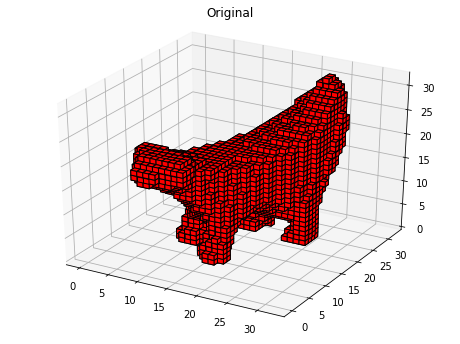

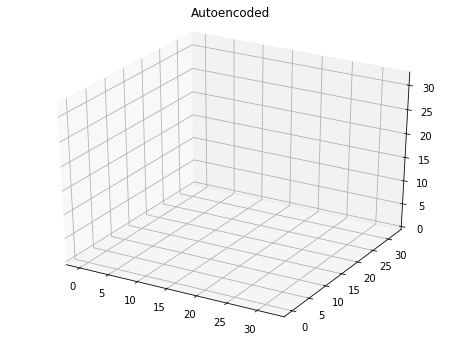

Epoch: 12, Batch: 0, Elapsed time: 8.30 mins
DEBUG_OP "max clipped_output": 0.9999879598617554
DEBUG_OP "min clipped_output": 0.04253293201327324
DEBUG_OP "mean clipped_output": 0.6482037305831909
	KL Divergence = 1325.38037109375, Reconstruction Loss = 706.4398803710938, -D_loss = 5.21868896484375, G_loss = -31.840442657470703
Epoch: 12, Batch: 1, Elapsed time: 8.44 mins
DEBUG_OP "max clipped_output": 0.9999899864196777
DEBUG_OP "min clipped_output": 0.02224227786064148
DEBUG_OP "mean clipped_output": 0.6203334927558899
	KL Divergence = 777.2677001953125, Reconstruction Loss = 816.1842651367188, -D_loss = 7.060405731201172, G_loss = -31.827178955078125
Epoch: 12, Batch: 2, Elapsed time: 8.60 mins
DEBUG_OP "max clipped_output": 0.9999309778213501
DEBUG_OP "min clipped_output": 0.028691068291664124
DEBUG_OP "mean clipped_output": 0.6289845108985901
	KL Divergence = 721.7481079101562, Reconstruction Loss = 768.27978515625, -D_loss = 9.257139205932617, G_loss = -33.75666427612305
Epoch: 1

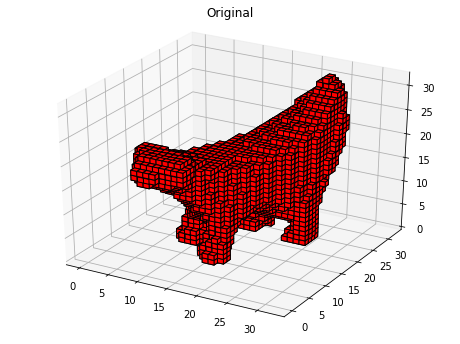

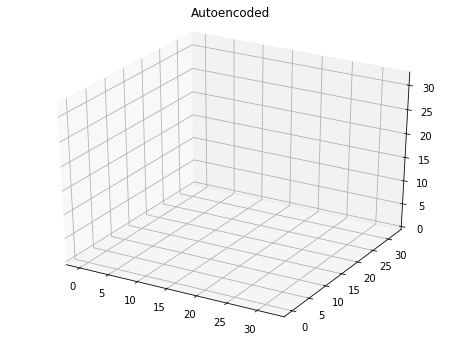

Epoch: 13, Batch: 0, Elapsed time: 8.96 mins
DEBUG_OP "max clipped_output": 0.9999974966049194
DEBUG_OP "min clipped_output": 0.014079258777201176
DEBUG_OP "mean clipped_output": 0.5875686407089233
	KL Divergence = 1035.4818115234375, Reconstruction Loss = 647.2294921875, -D_loss = 2.9077014923095703, G_loss = -31.981279373168945
Epoch: 13, Batch: 1, Elapsed time: 9.10 mins
DEBUG_OP "max clipped_output": 0.9999953508377075
DEBUG_OP "min clipped_output": 0.009589876979589462
DEBUG_OP "mean clipped_output": 0.5736739635467529
	KL Divergence = 727.32763671875, Reconstruction Loss = 801.9603271484375, -D_loss = 7.80061149597168, G_loss = -34.84135437011719
Epoch: 13, Batch: 2, Elapsed time: 9.25 mins
DEBUG_OP "max clipped_output": 0.9999974966049194
DEBUG_OP "min clipped_output": 0.010710418224334717
DEBUG_OP "mean clipped_output": 0.574972927570343
	KL Divergence = 2209.75732421875, Reconstruction Loss = 674.2474975585938, -D_loss = 6.787166595458984, G_loss = -33.493595123291016
Epoch: 1

C:\Users\cynth\Anaconda3\lib\site-packages\ipykernel_launcher.py:451: RuntimeWarning: invalid value encountered in greater


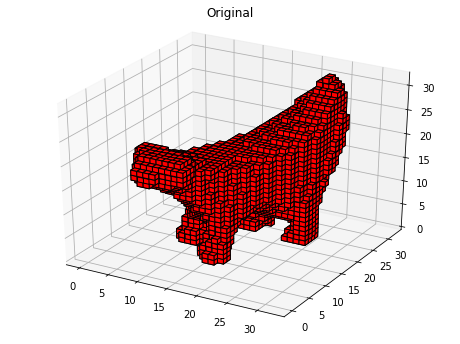

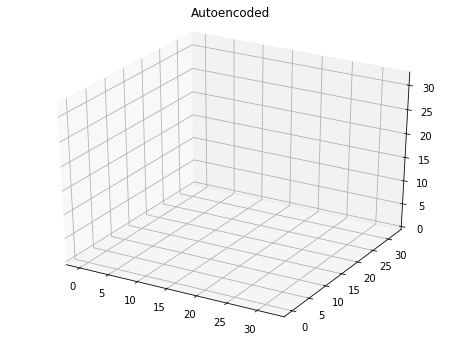

Epoch: 14, Batch: 0, Elapsed time: 9.62 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = inf, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 14, Batch: 1, Elapsed time: 9.77 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 14, Batch: 2, Elapsed time: 9.91 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 14, Batch: 3, Elapsed time: 10.05 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 15, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss = na

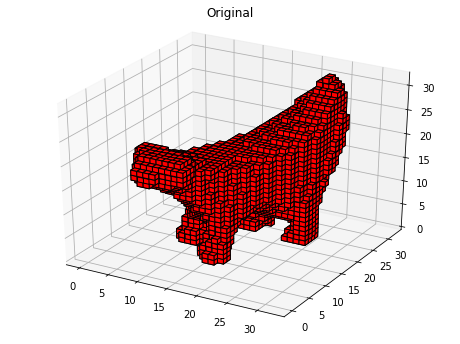

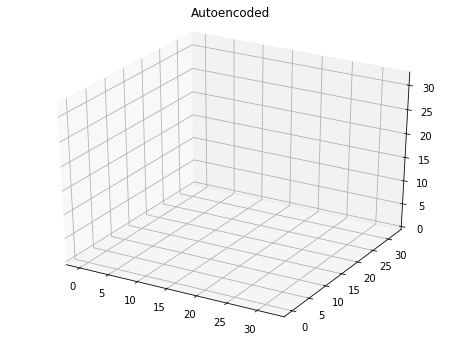

Epoch: 15, Batch: 0, Elapsed time: 10.27 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 15, Batch: 1, Elapsed time: 10.41 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 15, Batch: 2, Elapsed time: 10.55 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 15, Batch: 3, Elapsed time: 10.70 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 16, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

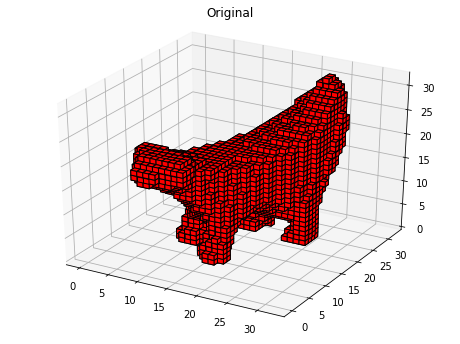

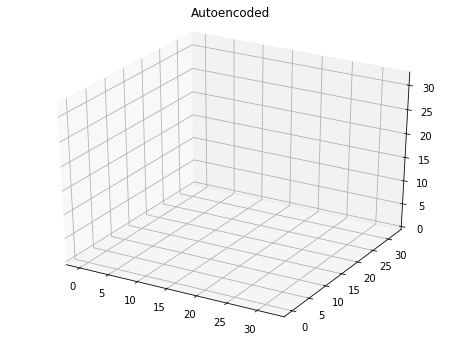

Epoch: 16, Batch: 0, Elapsed time: 10.90 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 16, Batch: 1, Elapsed time: 11.04 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 16, Batch: 2, Elapsed time: 11.19 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 16, Batch: 3, Elapsed time: 11.34 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 17, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

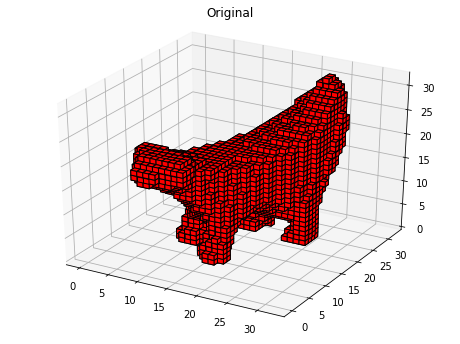

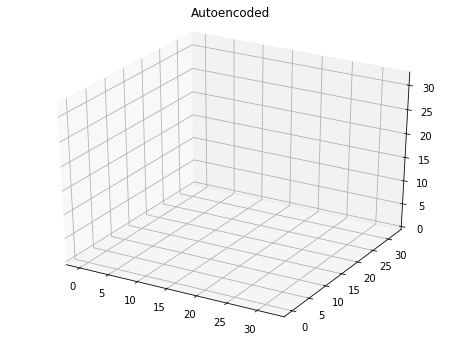

Epoch: 17, Batch: 0, Elapsed time: 11.54 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 17, Batch: 1, Elapsed time: 11.68 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 17, Batch: 2, Elapsed time: 11.82 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 17, Batch: 3, Elapsed time: 11.97 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 18, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

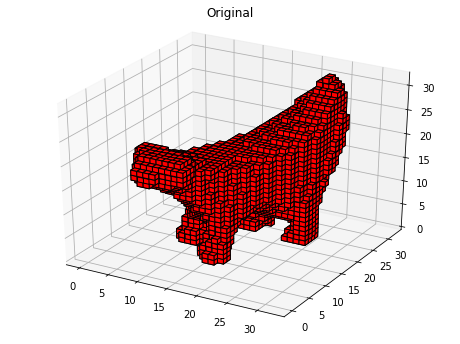

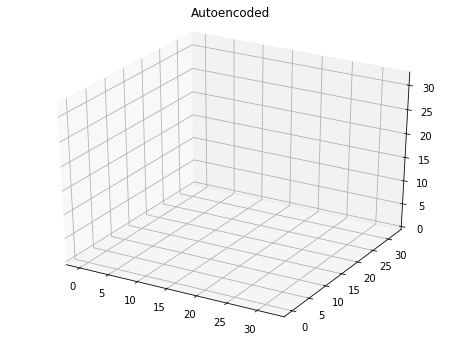

Epoch: 18, Batch: 0, Elapsed time: 12.17 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 18, Batch: 1, Elapsed time: 12.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 18, Batch: 2, Elapsed time: 12.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 18, Batch: 3, Elapsed time: 12.61 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 19, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

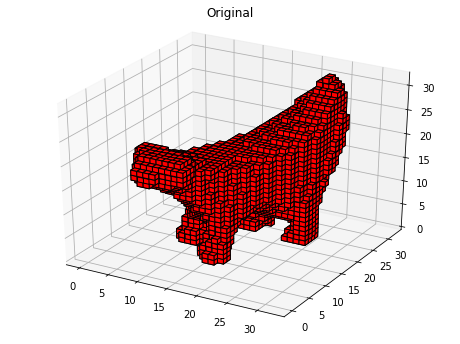

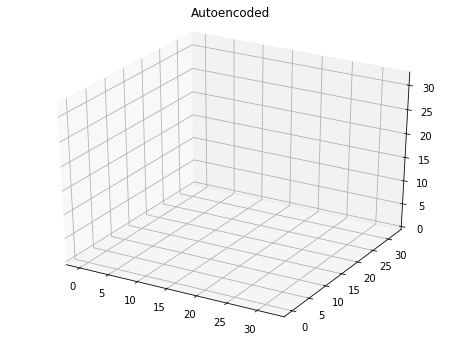

Epoch: 19, Batch: 0, Elapsed time: 12.82 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 19, Batch: 1, Elapsed time: 12.96 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 19, Batch: 2, Elapsed time: 13.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 19, Batch: 3, Elapsed time: 13.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 20, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

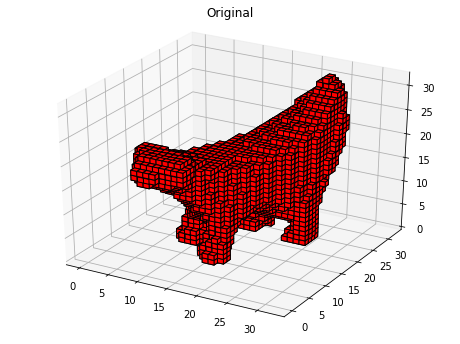

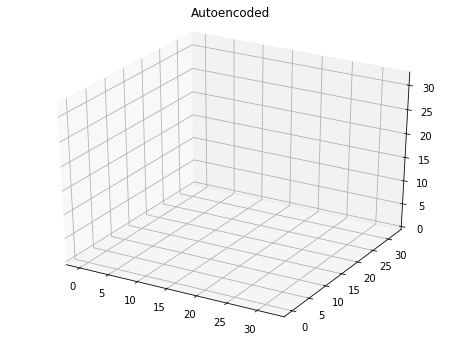

Epoch: 20, Batch: 0, Elapsed time: 13.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 20, Batch: 1, Elapsed time: 13.60 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 20, Batch: 2, Elapsed time: 13.74 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 20, Batch: 3, Elapsed time: 13.88 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 21, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

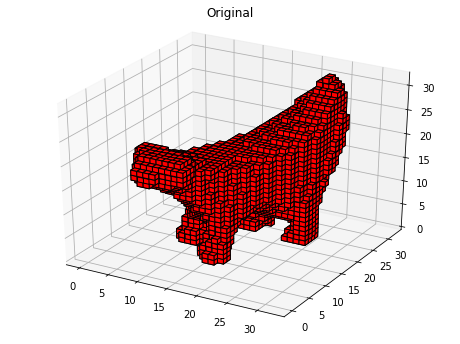

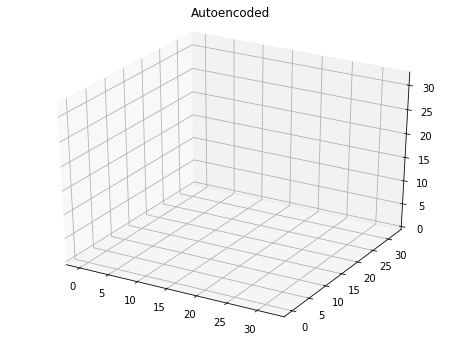

Epoch: 21, Batch: 0, Elapsed time: 14.08 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 21, Batch: 1, Elapsed time: 14.22 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 21, Batch: 2, Elapsed time: 14.37 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 21, Batch: 3, Elapsed time: 14.52 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 22, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

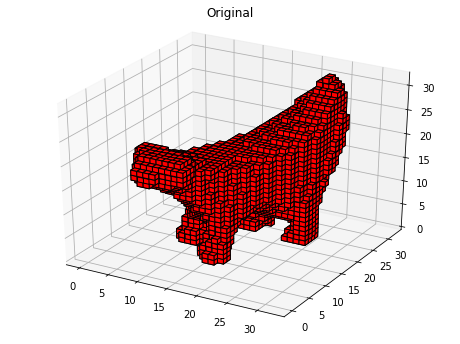

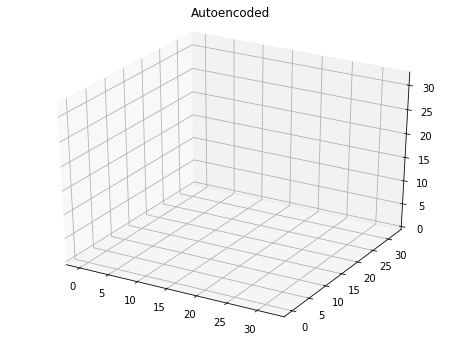

Epoch: 22, Batch: 0, Elapsed time: 14.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 22, Batch: 1, Elapsed time: 14.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 22, Batch: 2, Elapsed time: 15.00 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 22, Batch: 3, Elapsed time: 15.14 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 23, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

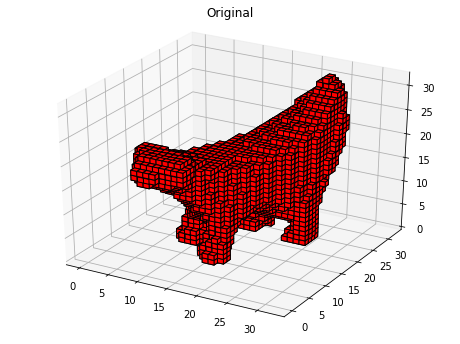

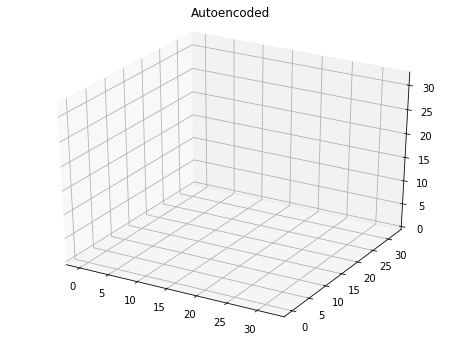

Epoch: 23, Batch: 0, Elapsed time: 15.34 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 23, Batch: 1, Elapsed time: 15.48 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 23, Batch: 2, Elapsed time: 15.63 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 23, Batch: 3, Elapsed time: 15.77 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 24, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

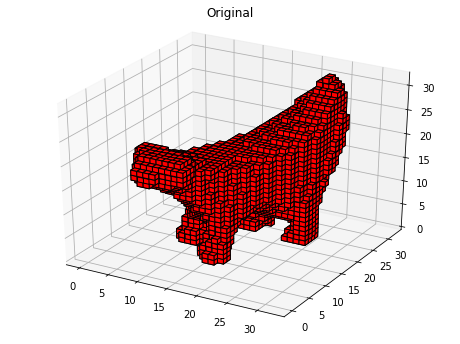

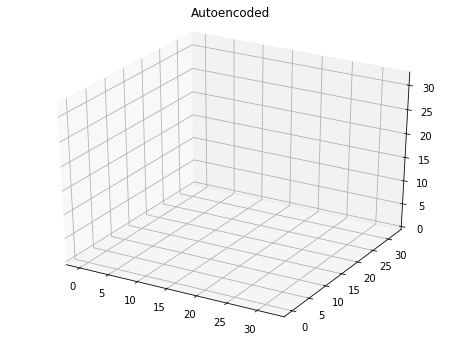

Epoch: 24, Batch: 0, Elapsed time: 15.97 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 24, Batch: 1, Elapsed time: 16.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 24, Batch: 2, Elapsed time: 16.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 24, Batch: 3, Elapsed time: 16.40 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 25, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

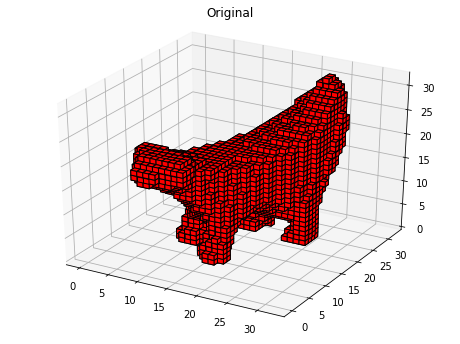

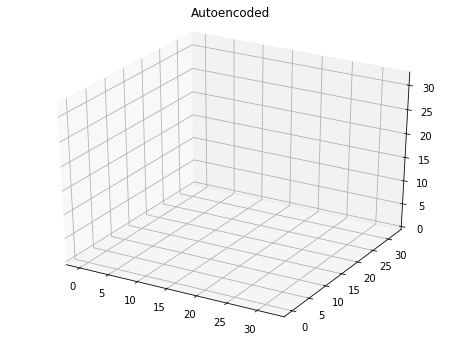

Epoch: 25, Batch: 0, Elapsed time: 16.60 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 25, Batch: 1, Elapsed time: 16.74 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 25, Batch: 2, Elapsed time: 16.88 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 25, Batch: 3, Elapsed time: 17.02 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 26, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

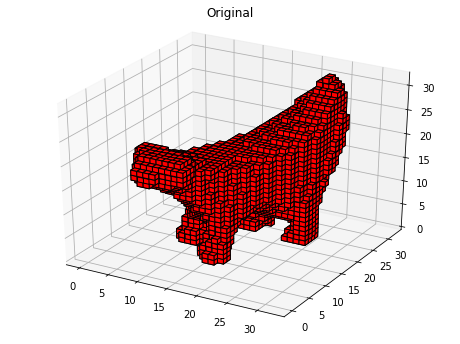

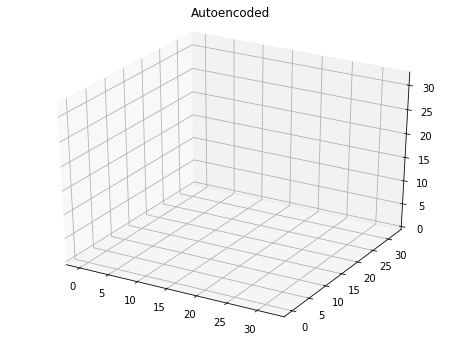

Epoch: 26, Batch: 0, Elapsed time: 17.23 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 26, Batch: 1, Elapsed time: 17.37 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 26, Batch: 2, Elapsed time: 17.51 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 26, Batch: 3, Elapsed time: 17.65 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 27, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

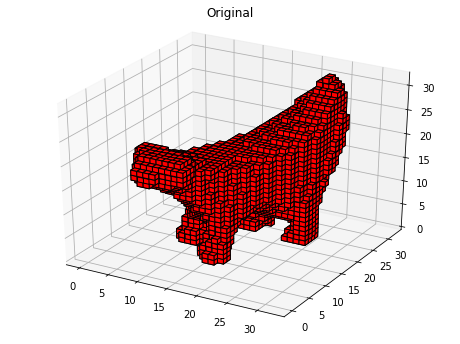

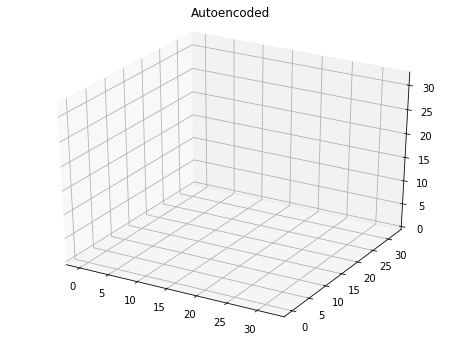

Epoch: 27, Batch: 0, Elapsed time: 17.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 27, Batch: 1, Elapsed time: 17.98 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 27, Batch: 2, Elapsed time: 18.13 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 27, Batch: 3, Elapsed time: 18.27 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 28, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

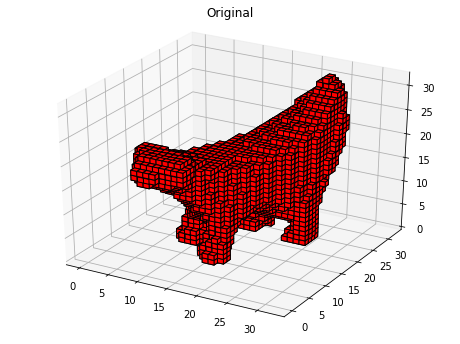

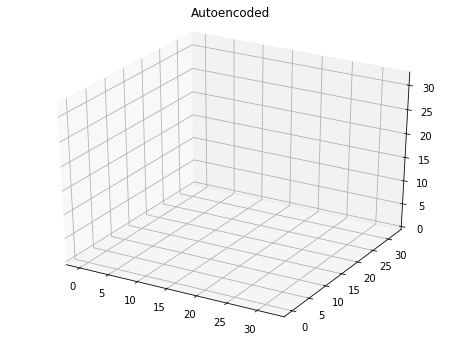

Epoch: 28, Batch: 0, Elapsed time: 18.47 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 28, Batch: 1, Elapsed time: 18.61 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 28, Batch: 2, Elapsed time: 18.75 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 28, Batch: 3, Elapsed time: 18.89 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 29, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

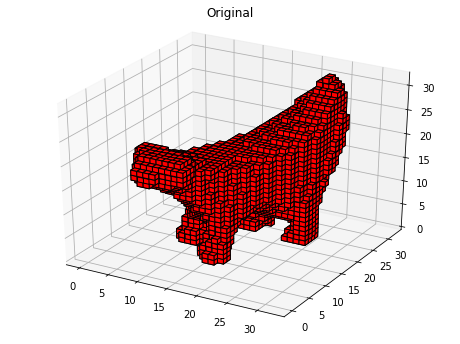

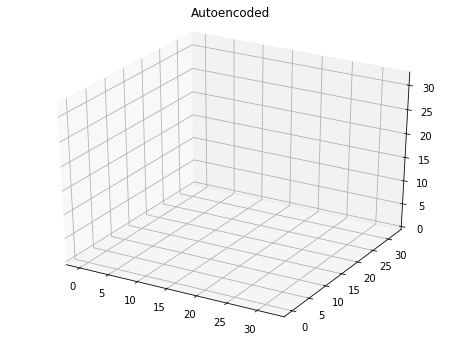

Epoch: 29, Batch: 0, Elapsed time: 19.09 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 29, Batch: 1, Elapsed time: 19.23 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 29, Batch: 2, Elapsed time: 19.37 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 29, Batch: 3, Elapsed time: 19.51 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 30, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

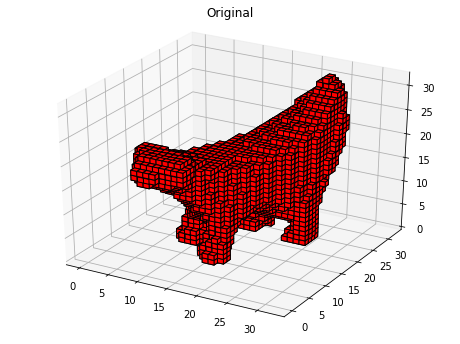

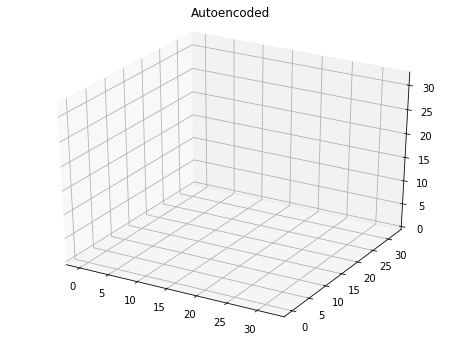

Epoch: 30, Batch: 0, Elapsed time: 19.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 30, Batch: 1, Elapsed time: 19.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 30, Batch: 2, Elapsed time: 19.99 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 30, Batch: 3, Elapsed time: 20.13 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 31, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

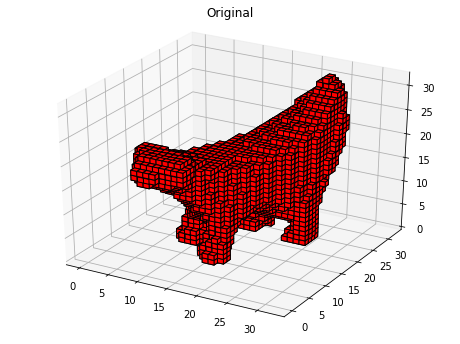

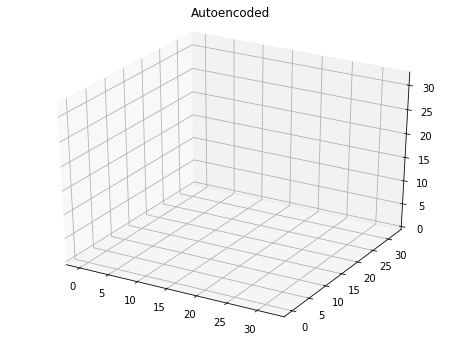

Epoch: 31, Batch: 0, Elapsed time: 20.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 31, Batch: 1, Elapsed time: 20.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 31, Batch: 2, Elapsed time: 20.61 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 31, Batch: 3, Elapsed time: 20.75 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 32, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

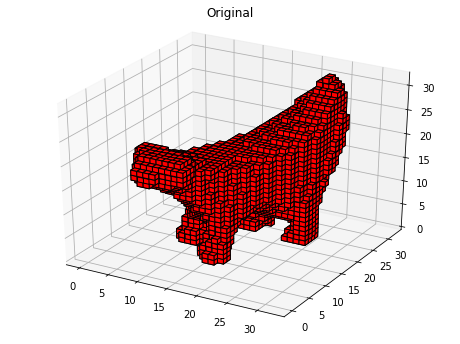

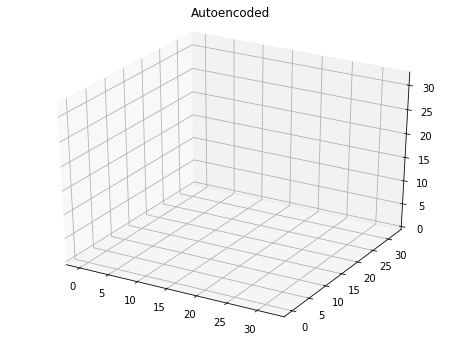

Epoch: 32, Batch: 0, Elapsed time: 20.95 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 32, Batch: 1, Elapsed time: 21.08 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 32, Batch: 2, Elapsed time: 21.22 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 32, Batch: 3, Elapsed time: 21.37 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 33, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

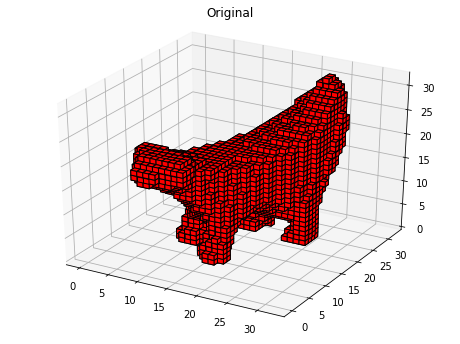

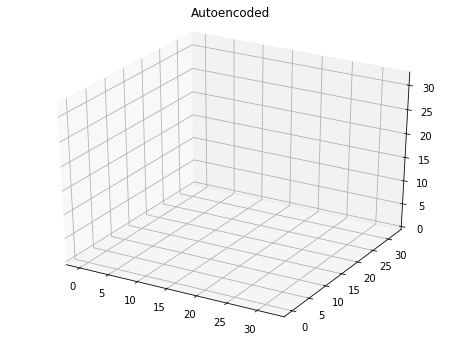

Epoch: 33, Batch: 0, Elapsed time: 21.57 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 33, Batch: 1, Elapsed time: 21.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 33, Batch: 2, Elapsed time: 21.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 33, Batch: 3, Elapsed time: 22.00 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 34, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

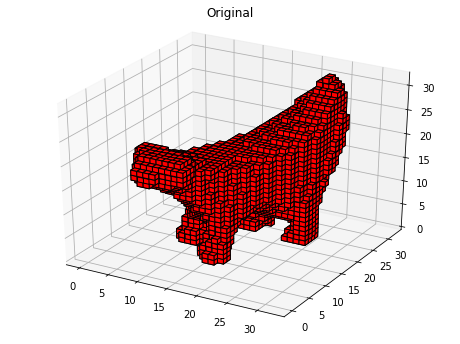

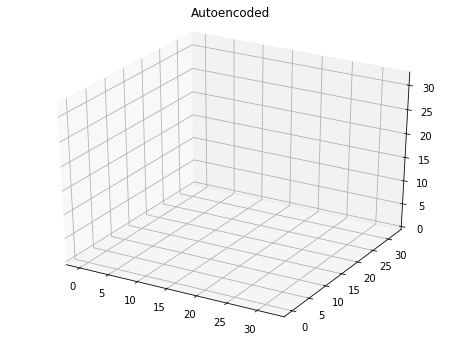

Epoch: 34, Batch: 0, Elapsed time: 22.19 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 34, Batch: 1, Elapsed time: 22.33 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 34, Batch: 2, Elapsed time: 22.47 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 34, Batch: 3, Elapsed time: 22.62 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 35, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

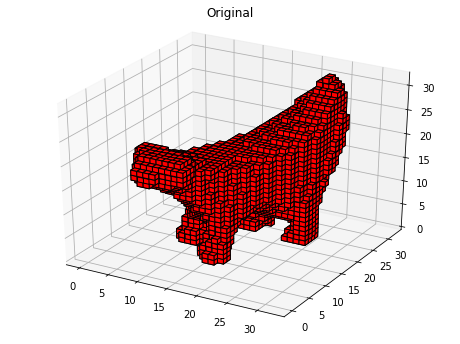

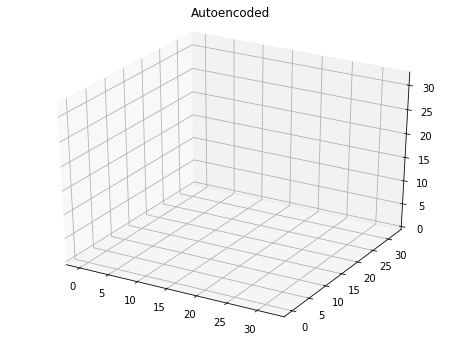

Epoch: 35, Batch: 0, Elapsed time: 22.82 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 35, Batch: 1, Elapsed time: 22.95 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 35, Batch: 2, Elapsed time: 23.10 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 35, Batch: 3, Elapsed time: 23.24 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 36, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

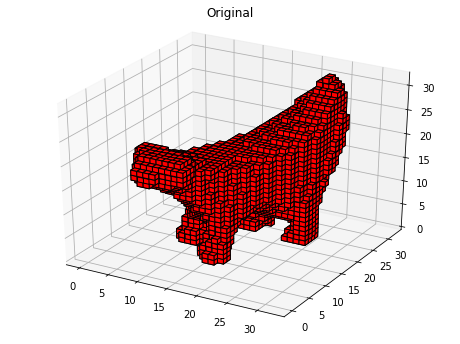

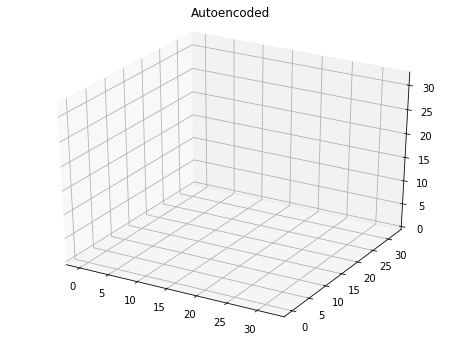

Epoch: 36, Batch: 0, Elapsed time: 23.44 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 36, Batch: 1, Elapsed time: 23.57 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 36, Batch: 2, Elapsed time: 23.72 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 36, Batch: 3, Elapsed time: 23.86 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 37, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

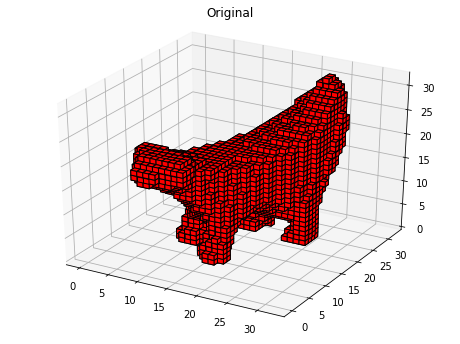

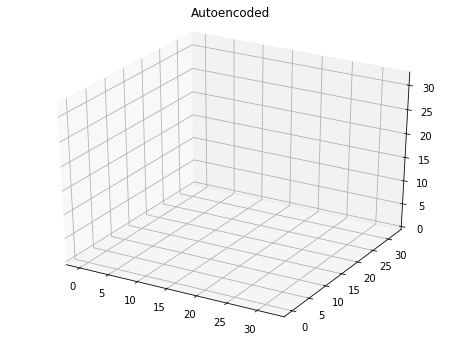

Epoch: 37, Batch: 0, Elapsed time: 24.06 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 37, Batch: 1, Elapsed time: 24.19 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 37, Batch: 2, Elapsed time: 24.33 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 37, Batch: 3, Elapsed time: 24.47 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 38, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

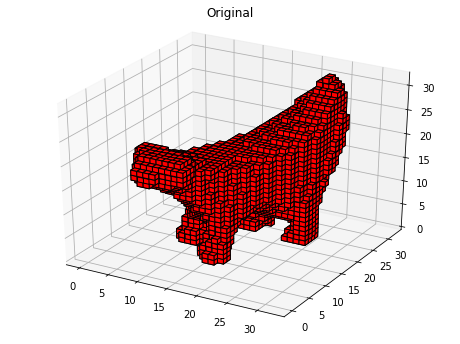

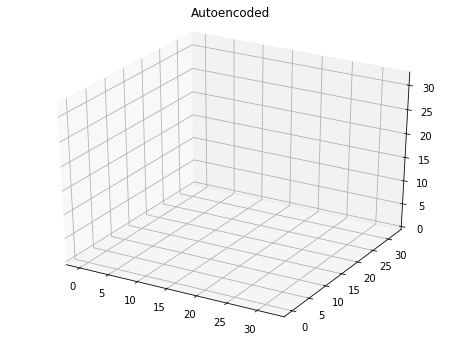

Epoch: 38, Batch: 0, Elapsed time: 24.67 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 38, Batch: 1, Elapsed time: 24.80 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 38, Batch: 2, Elapsed time: 24.95 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 38, Batch: 3, Elapsed time: 25.09 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 39, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

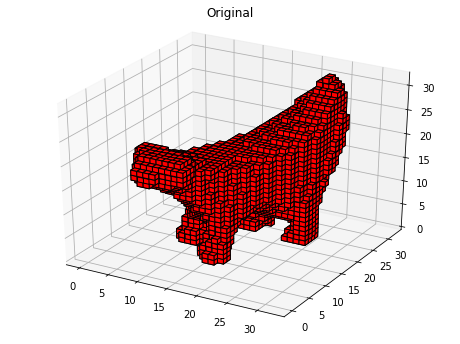

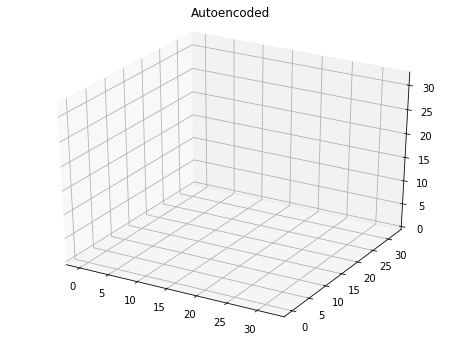

Epoch: 39, Batch: 0, Elapsed time: 25.28 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 39, Batch: 1, Elapsed time: 25.42 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 39, Batch: 2, Elapsed time: 25.56 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 39, Batch: 3, Elapsed time: 25.70 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 40, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

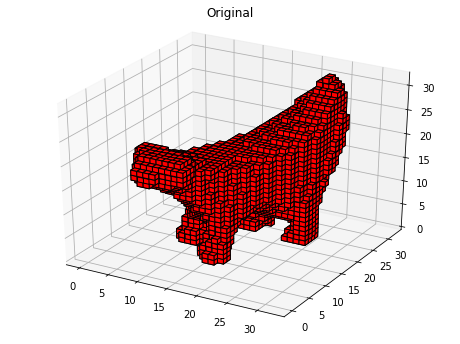

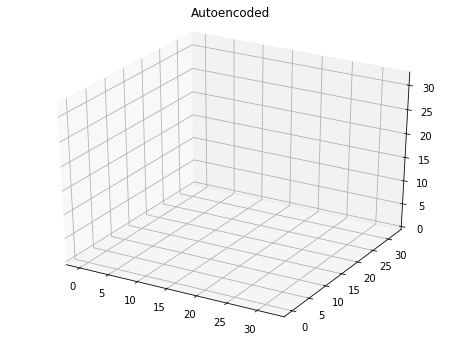

Epoch: 40, Batch: 0, Elapsed time: 25.90 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 40, Batch: 1, Elapsed time: 26.03 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 40, Batch: 2, Elapsed time: 26.17 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 40, Batch: 3, Elapsed time: 26.31 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 41, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

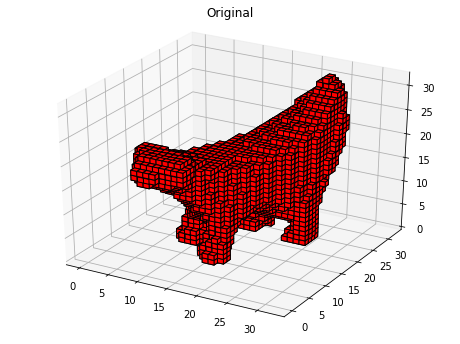

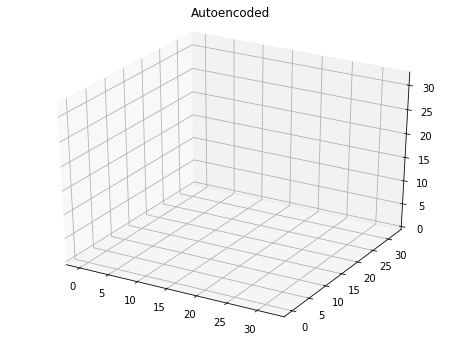

Epoch: 41, Batch: 0, Elapsed time: 26.51 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 41, Batch: 1, Elapsed time: 26.65 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 41, Batch: 2, Elapsed time: 26.79 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 41, Batch: 3, Elapsed time: 26.93 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 42, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

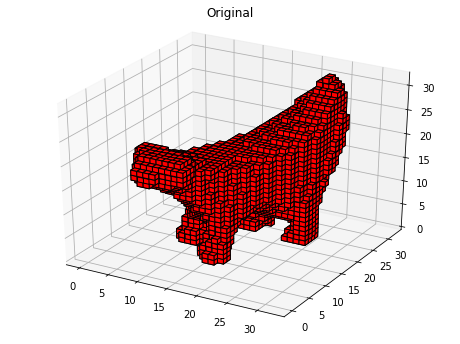

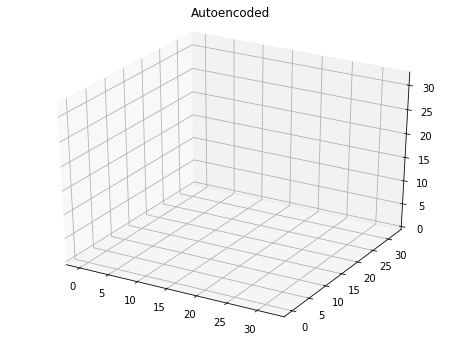

Epoch: 42, Batch: 0, Elapsed time: 27.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 42, Batch: 1, Elapsed time: 27.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 42, Batch: 2, Elapsed time: 27.40 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 42, Batch: 3, Elapsed time: 27.54 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 43, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

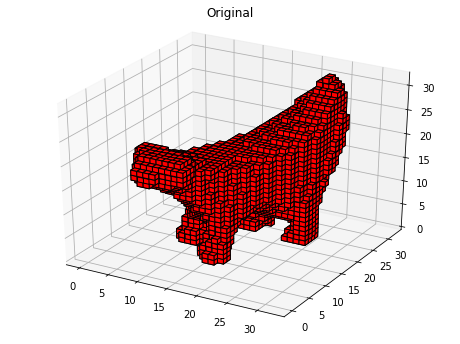

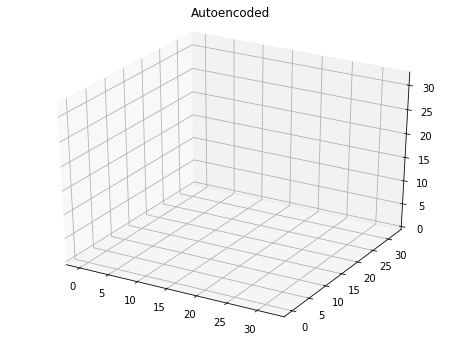

Epoch: 43, Batch: 0, Elapsed time: 27.73 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 43, Batch: 1, Elapsed time: 27.87 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 43, Batch: 2, Elapsed time: 28.01 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 43, Batch: 3, Elapsed time: 28.15 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 44, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

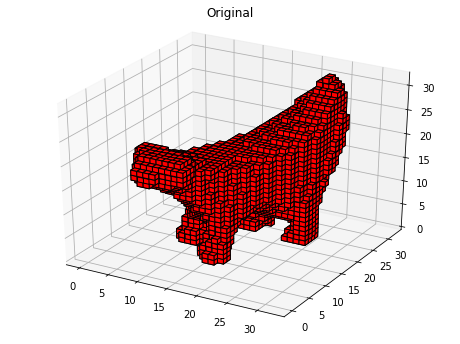

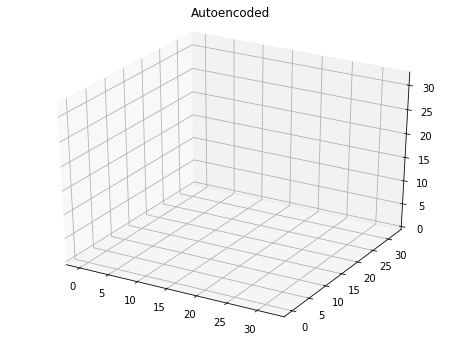

Epoch: 44, Batch: 0, Elapsed time: 28.35 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 44, Batch: 1, Elapsed time: 28.48 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 44, Batch: 2, Elapsed time: 28.63 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 44, Batch: 3, Elapsed time: 28.77 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 45, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

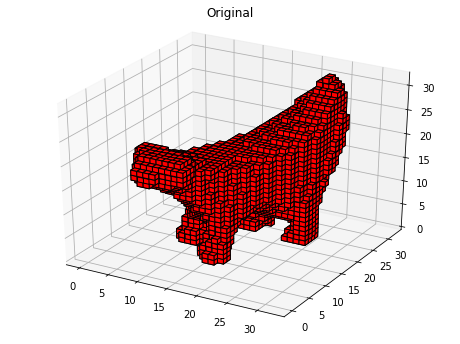

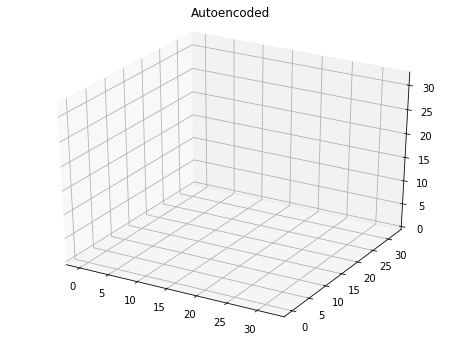

Epoch: 45, Batch: 0, Elapsed time: 28.96 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 45, Batch: 1, Elapsed time: 29.10 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 45, Batch: 2, Elapsed time: 29.24 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 45, Batch: 3, Elapsed time: 29.38 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 46, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

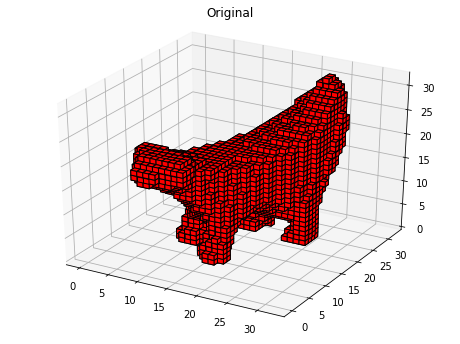

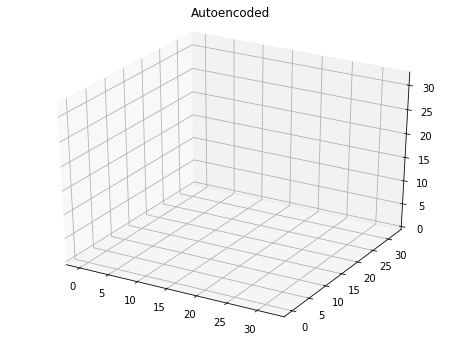

Epoch: 46, Batch: 0, Elapsed time: 29.57 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 46, Batch: 1, Elapsed time: 29.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 46, Batch: 2, Elapsed time: 29.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 46, Batch: 3, Elapsed time: 29.99 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 47, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

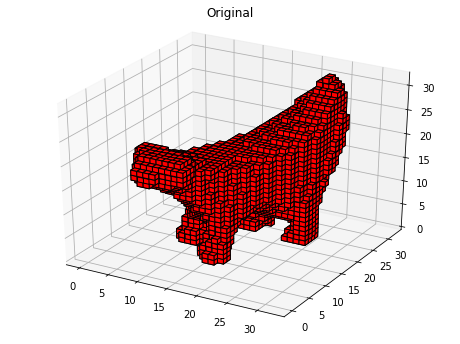

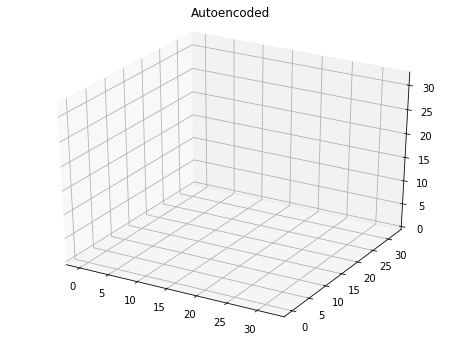

Epoch: 47, Batch: 0, Elapsed time: 30.18 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 47, Batch: 1, Elapsed time: 30.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 47, Batch: 2, Elapsed time: 30.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 47, Batch: 3, Elapsed time: 30.60 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 48, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

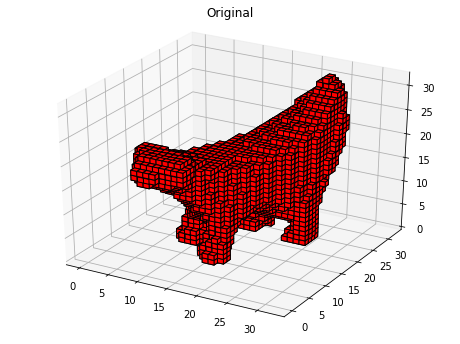

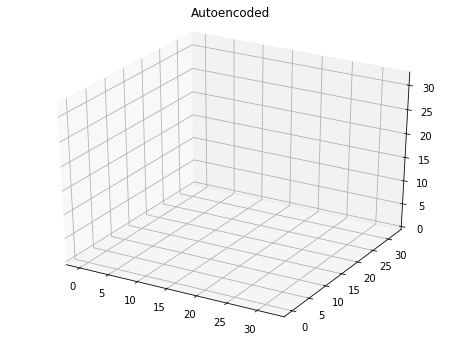

Epoch: 48, Batch: 0, Elapsed time: 30.80 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 48, Batch: 1, Elapsed time: 30.94 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 48, Batch: 2, Elapsed time: 31.08 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 48, Batch: 3, Elapsed time: 31.22 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 49, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

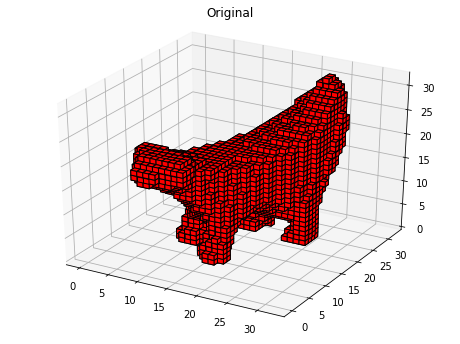

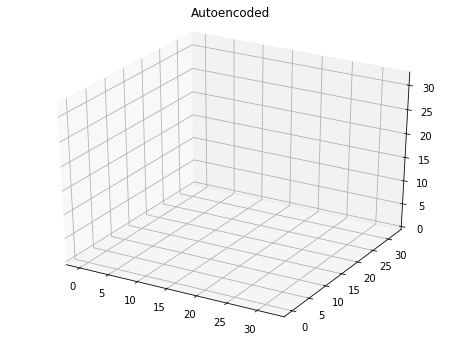

Epoch: 49, Batch: 0, Elapsed time: 31.42 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 49, Batch: 1, Elapsed time: 31.55 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 49, Batch: 2, Elapsed time: 31.69 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 49, Batch: 3, Elapsed time: 31.83 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 50, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

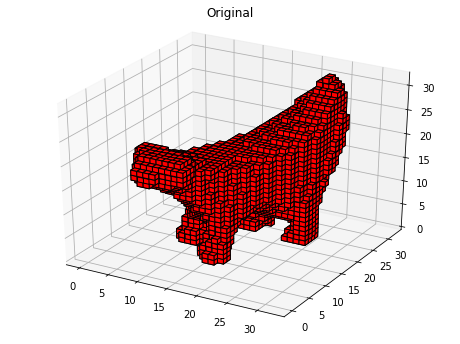

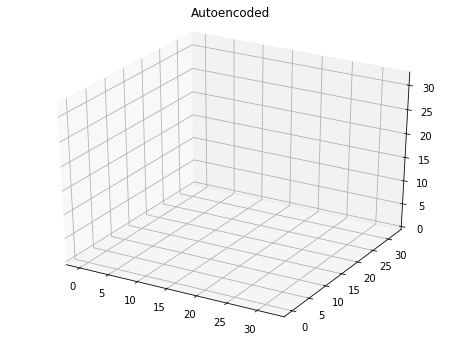

Epoch: 50, Batch: 0, Elapsed time: 32.03 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 50, Batch: 1, Elapsed time: 32.16 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 50, Batch: 2, Elapsed time: 32.30 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 50, Batch: 3, Elapsed time: 32.44 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 51, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

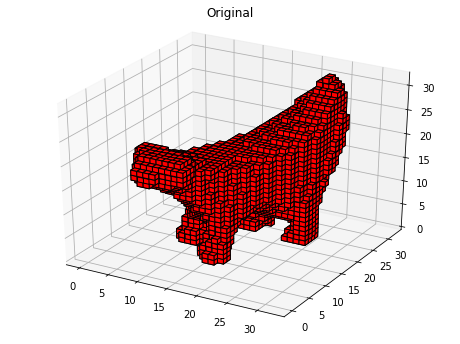

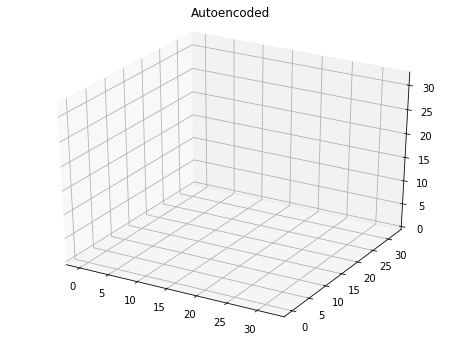

Epoch: 51, Batch: 0, Elapsed time: 32.64 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 51, Batch: 1, Elapsed time: 32.78 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 51, Batch: 2, Elapsed time: 32.92 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 51, Batch: 3, Elapsed time: 33.06 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 52, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

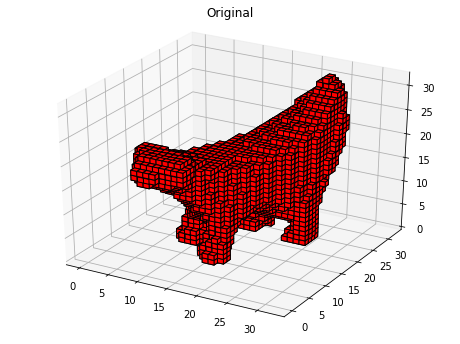

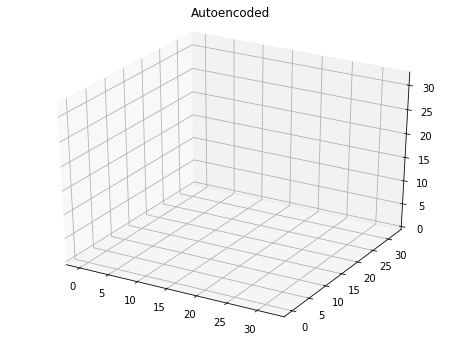

Epoch: 52, Batch: 0, Elapsed time: 33.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 52, Batch: 1, Elapsed time: 33.39 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 52, Batch: 2, Elapsed time: 33.53 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 52, Batch: 3, Elapsed time: 33.67 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 53, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

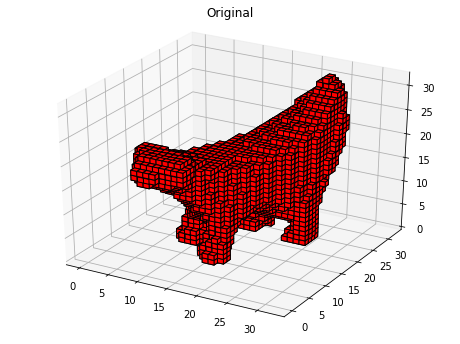

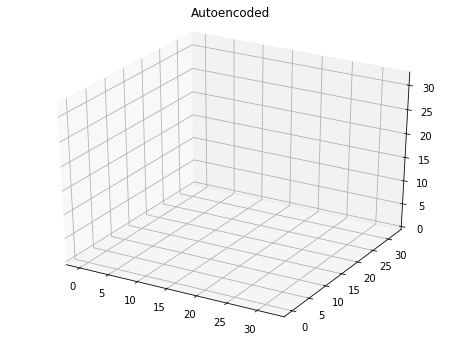

Epoch: 53, Batch: 0, Elapsed time: 33.87 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 53, Batch: 1, Elapsed time: 34.00 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 53, Batch: 2, Elapsed time: 34.14 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 53, Batch: 3, Elapsed time: 34.28 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 54, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

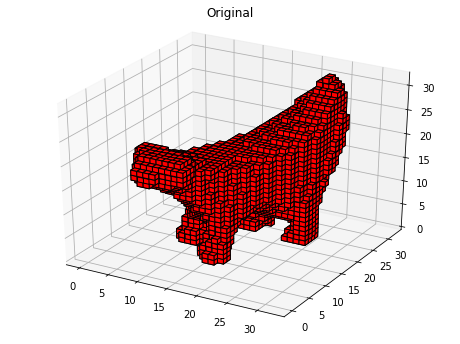

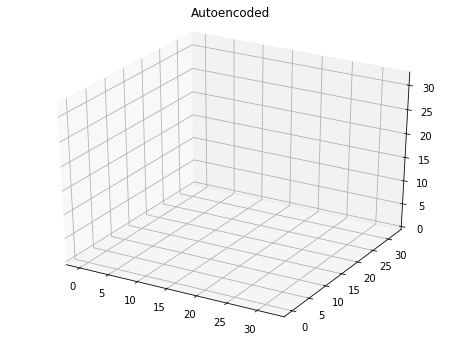

Epoch: 54, Batch: 0, Elapsed time: 34.47 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 54, Batch: 1, Elapsed time: 34.61 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 54, Batch: 2, Elapsed time: 34.75 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 54, Batch: 3, Elapsed time: 34.89 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 55, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

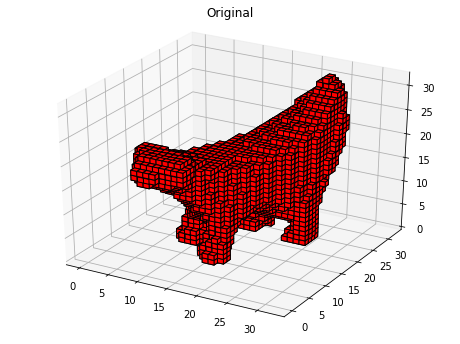

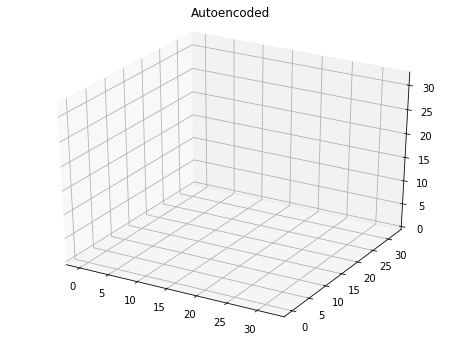

Epoch: 55, Batch: 0, Elapsed time: 35.09 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 55, Batch: 1, Elapsed time: 35.22 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 55, Batch: 2, Elapsed time: 35.36 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 55, Batch: 3, Elapsed time: 35.50 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 56, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

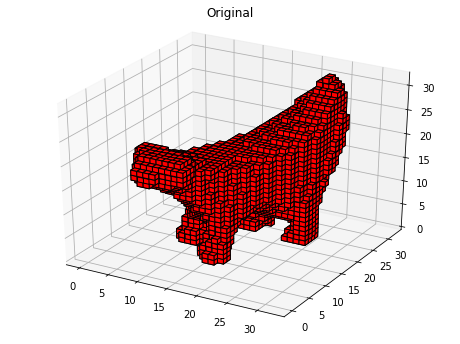

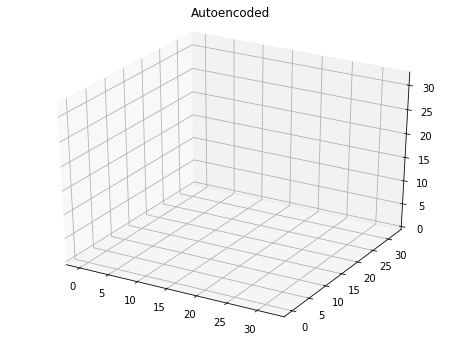

Epoch: 56, Batch: 0, Elapsed time: 35.70 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 56, Batch: 1, Elapsed time: 35.84 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 56, Batch: 2, Elapsed time: 35.98 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 56, Batch: 3, Elapsed time: 36.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 57, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

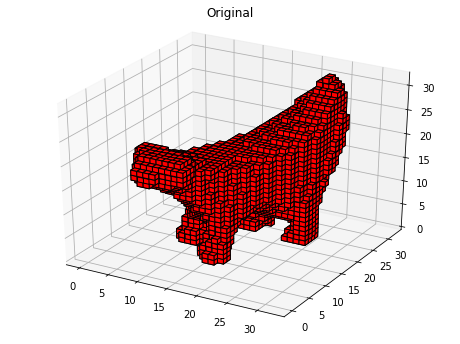

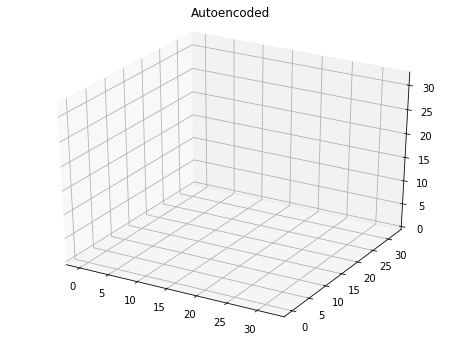

Epoch: 57, Batch: 0, Elapsed time: 36.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 57, Batch: 1, Elapsed time: 36.45 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 57, Batch: 2, Elapsed time: 36.60 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 57, Batch: 3, Elapsed time: 36.74 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 58, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

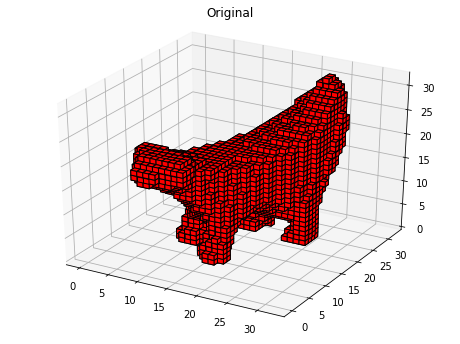

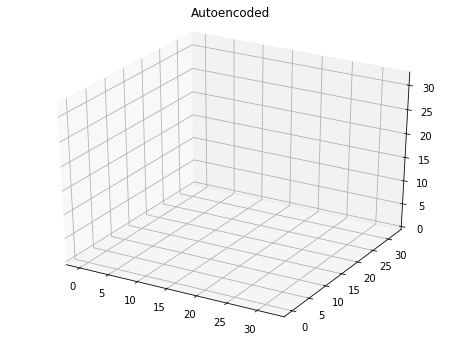

Epoch: 58, Batch: 0, Elapsed time: 36.94 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 58, Batch: 1, Elapsed time: 37.07 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 58, Batch: 2, Elapsed time: 37.21 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 58, Batch: 3, Elapsed time: 37.35 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 59, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

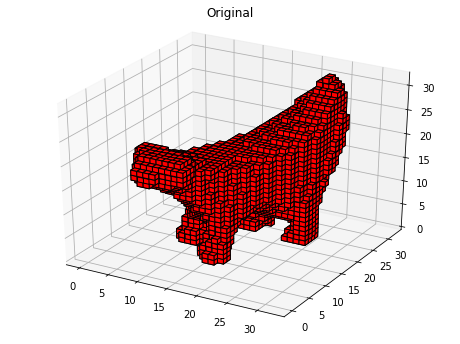

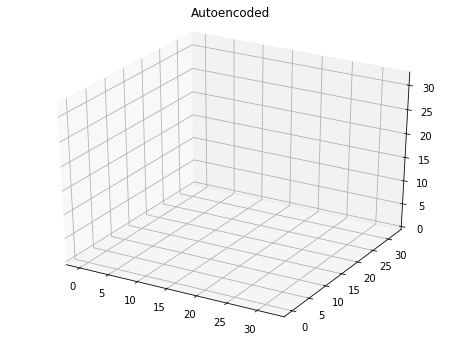

Epoch: 59, Batch: 0, Elapsed time: 37.55 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 59, Batch: 1, Elapsed time: 37.68 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 59, Batch: 2, Elapsed time: 37.82 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 59, Batch: 3, Elapsed time: 37.96 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 60, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

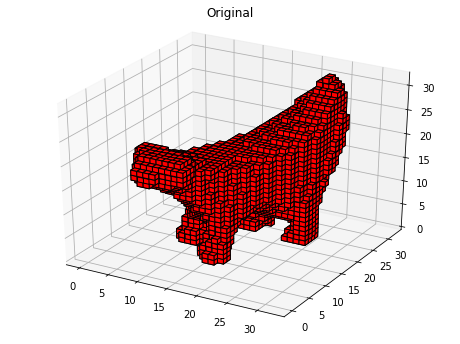

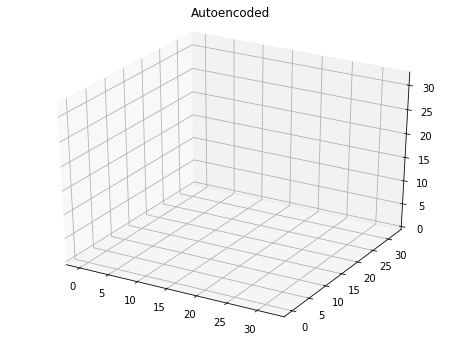

Epoch: 60, Batch: 0, Elapsed time: 38.16 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 60, Batch: 1, Elapsed time: 38.30 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 60, Batch: 2, Elapsed time: 38.44 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 60, Batch: 3, Elapsed time: 38.59 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 61, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

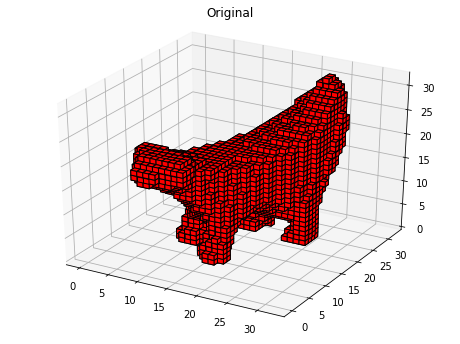

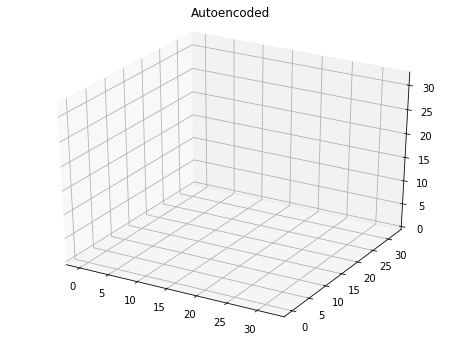

Epoch: 61, Batch: 0, Elapsed time: 38.78 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 61, Batch: 1, Elapsed time: 38.92 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 61, Batch: 2, Elapsed time: 39.06 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 61, Batch: 3, Elapsed time: 39.20 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 62, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

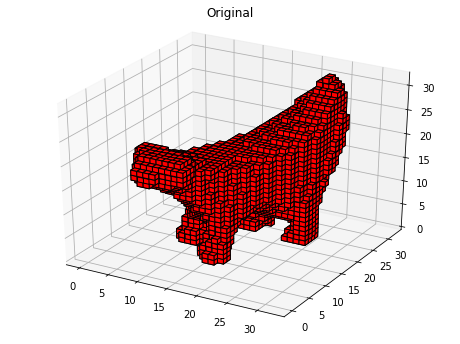

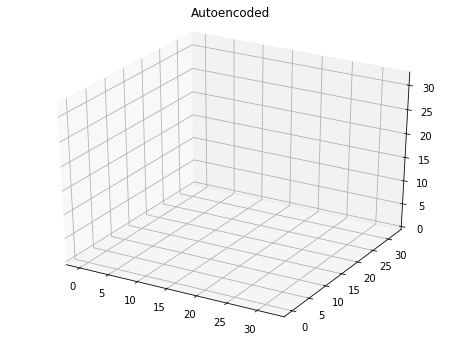

Epoch: 62, Batch: 0, Elapsed time: 39.39 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 62, Batch: 1, Elapsed time: 39.53 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 62, Batch: 2, Elapsed time: 39.67 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 62, Batch: 3, Elapsed time: 39.81 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 63, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

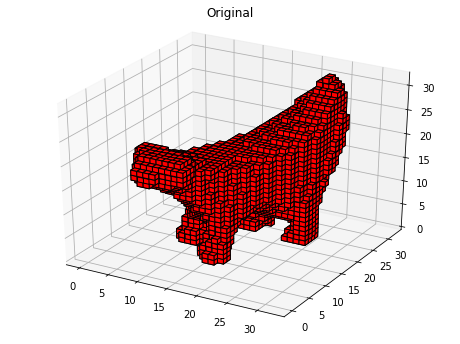

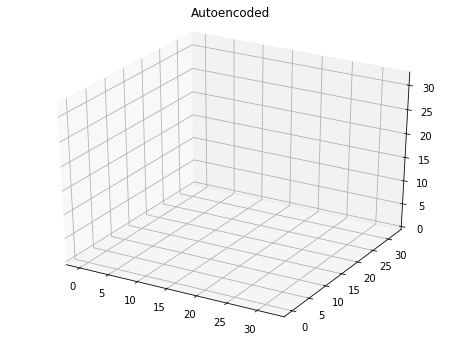

Epoch: 63, Batch: 0, Elapsed time: 40.00 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 63, Batch: 1, Elapsed time: 40.14 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 63, Batch: 2, Elapsed time: 40.28 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 63, Batch: 3, Elapsed time: 40.42 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 64, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

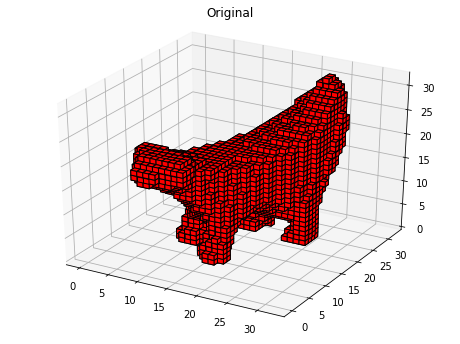

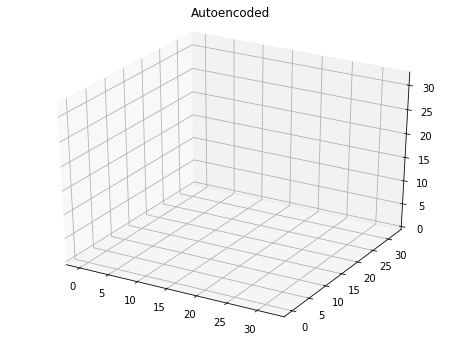

Epoch: 64, Batch: 0, Elapsed time: 40.62 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 64, Batch: 1, Elapsed time: 40.76 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 64, Batch: 2, Elapsed time: 40.90 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 64, Batch: 3, Elapsed time: 41.04 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 65, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

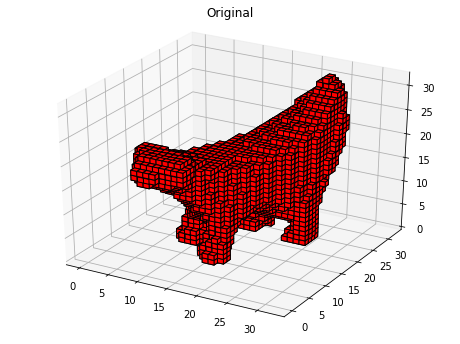

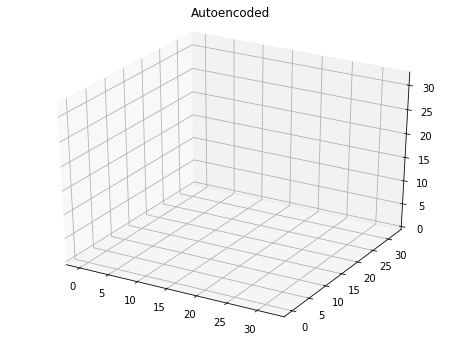

Epoch: 65, Batch: 0, Elapsed time: 41.24 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 65, Batch: 1, Elapsed time: 41.38 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 65, Batch: 2, Elapsed time: 41.52 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 65, Batch: 3, Elapsed time: 41.65 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 66, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

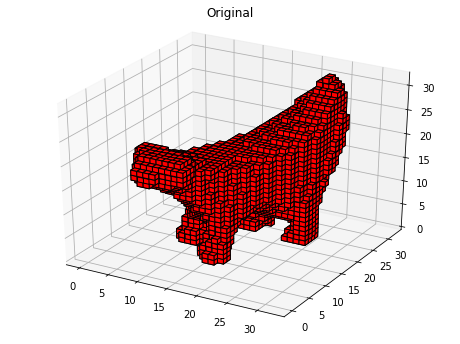

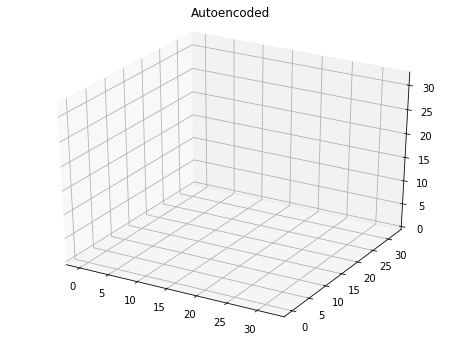

Epoch: 66, Batch: 0, Elapsed time: 41.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 66, Batch: 1, Elapsed time: 41.98 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 66, Batch: 2, Elapsed time: 42.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 66, Batch: 3, Elapsed time: 42.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 67, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

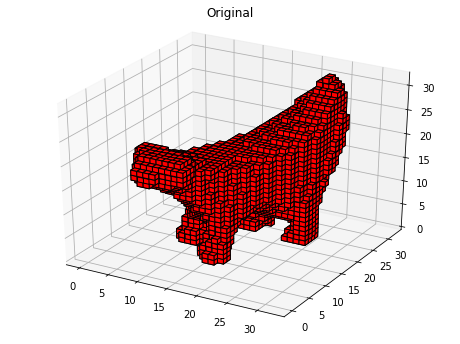

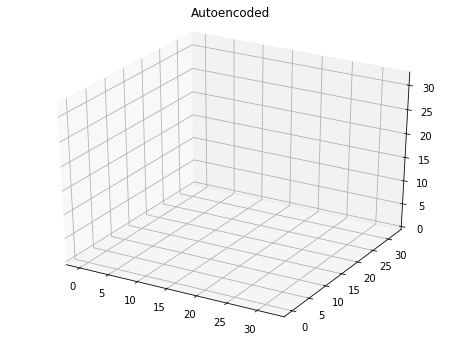

Epoch: 67, Batch: 0, Elapsed time: 42.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 67, Batch: 1, Elapsed time: 42.60 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 67, Batch: 2, Elapsed time: 42.74 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 67, Batch: 3, Elapsed time: 42.88 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 68, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

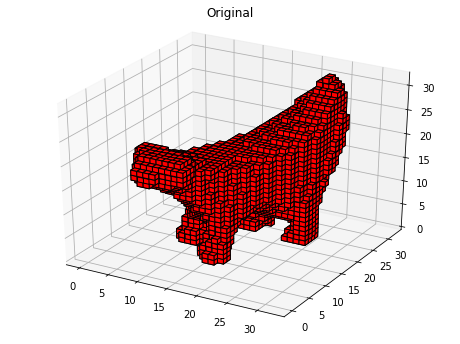

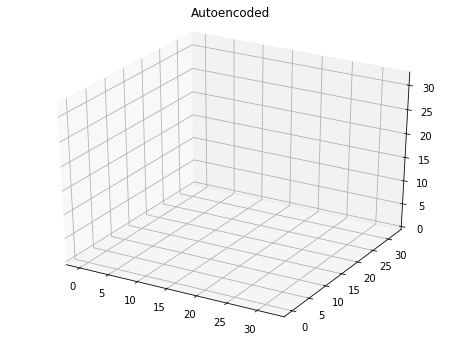

Epoch: 68, Batch: 0, Elapsed time: 43.08 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 68, Batch: 1, Elapsed time: 43.21 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 68, Batch: 2, Elapsed time: 43.35 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 68, Batch: 3, Elapsed time: 43.50 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 69, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

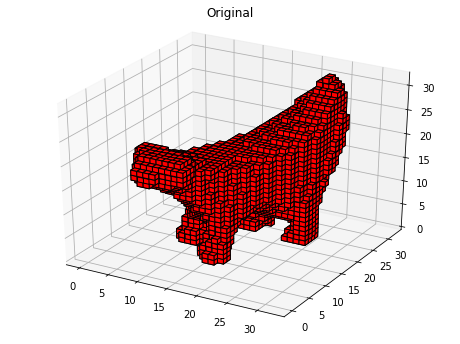

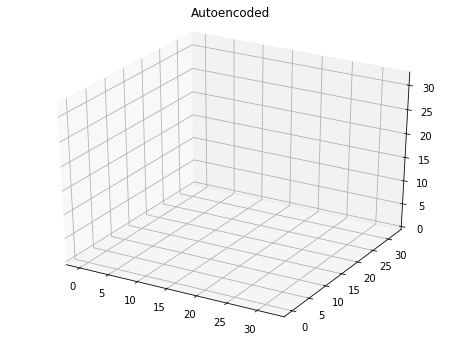

Epoch: 69, Batch: 0, Elapsed time: 43.69 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 69, Batch: 1, Elapsed time: 43.83 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 69, Batch: 2, Elapsed time: 43.96 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 69, Batch: 3, Elapsed time: 44.10 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 70, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

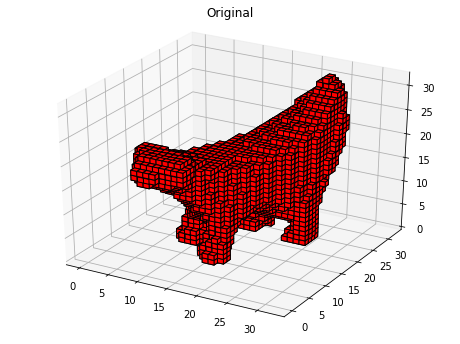

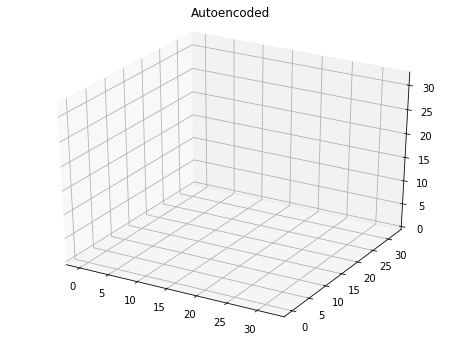

Epoch: 70, Batch: 0, Elapsed time: 44.30 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 70, Batch: 1, Elapsed time: 44.43 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 70, Batch: 2, Elapsed time: 44.58 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 70, Batch: 3, Elapsed time: 44.72 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 71, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

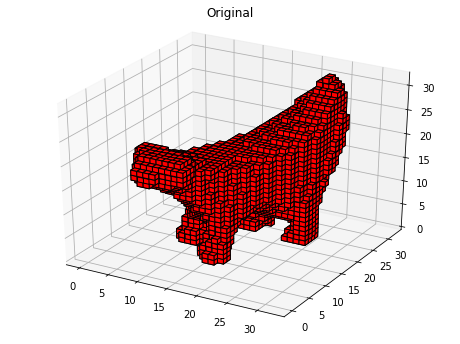

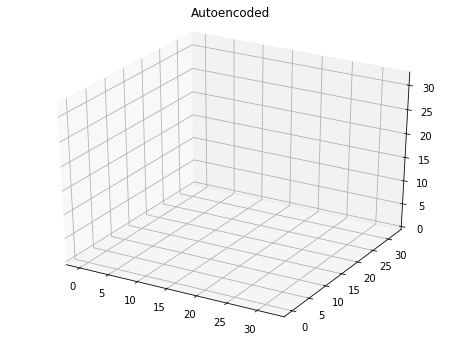

Epoch: 71, Batch: 0, Elapsed time: 44.92 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 71, Batch: 1, Elapsed time: 45.05 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 71, Batch: 2, Elapsed time: 45.19 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 71, Batch: 3, Elapsed time: 45.33 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 72, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

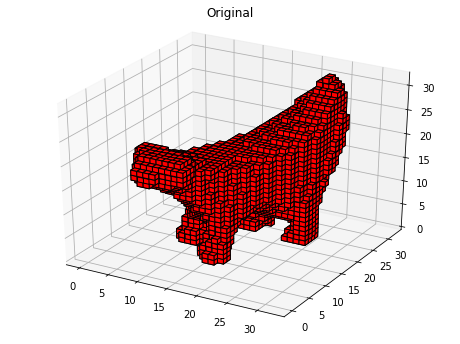

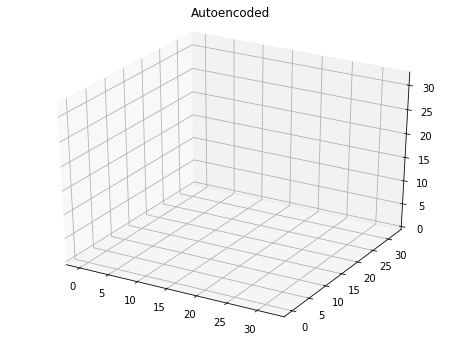

Epoch: 72, Batch: 0, Elapsed time: 45.53 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 72, Batch: 1, Elapsed time: 45.67 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 72, Batch: 2, Elapsed time: 45.81 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 72, Batch: 3, Elapsed time: 45.95 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 73, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

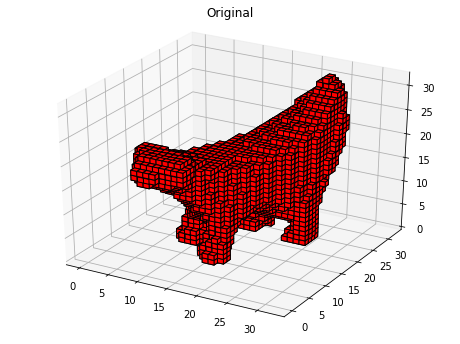

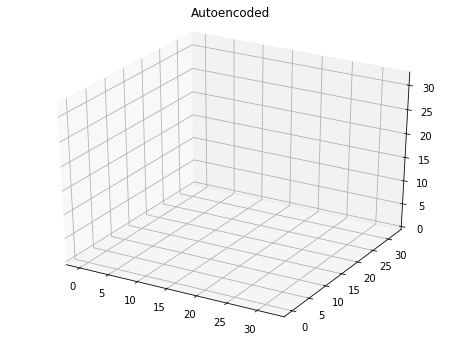

Epoch: 73, Batch: 0, Elapsed time: 46.15 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 73, Batch: 1, Elapsed time: 46.28 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 73, Batch: 2, Elapsed time: 46.42 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 73, Batch: 3, Elapsed time: 46.56 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 74, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

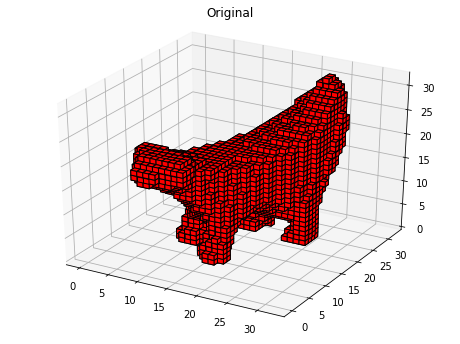

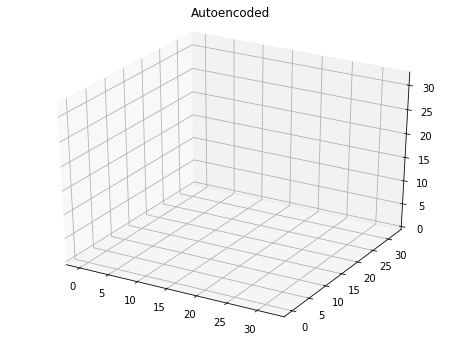

Epoch: 74, Batch: 0, Elapsed time: 46.76 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 74, Batch: 1, Elapsed time: 46.90 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 74, Batch: 2, Elapsed time: 47.04 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 74, Batch: 3, Elapsed time: 47.18 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 75, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

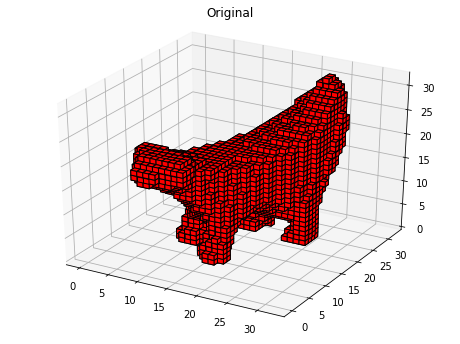

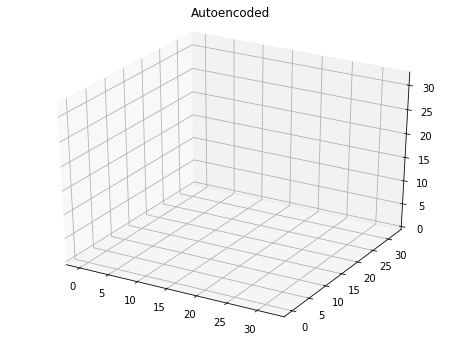

Epoch: 75, Batch: 0, Elapsed time: 47.38 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 75, Batch: 1, Elapsed time: 47.52 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 75, Batch: 2, Elapsed time: 47.66 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 75, Batch: 3, Elapsed time: 47.80 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 76, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

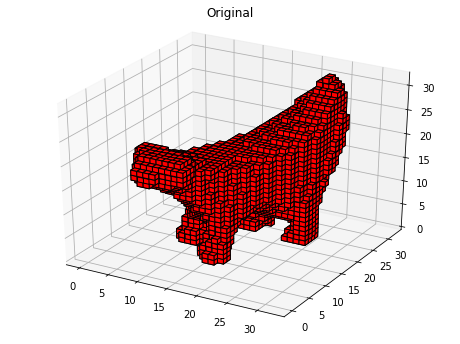

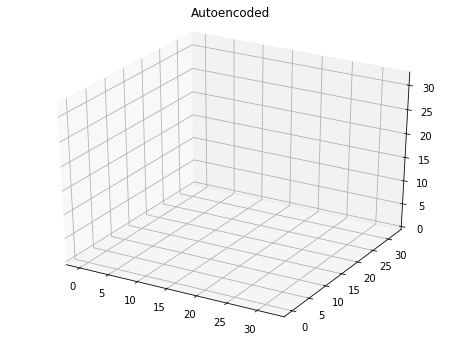

Epoch: 76, Batch: 0, Elapsed time: 48.00 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 76, Batch: 1, Elapsed time: 48.13 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 76, Batch: 2, Elapsed time: 48.27 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 76, Batch: 3, Elapsed time: 48.41 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 77, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

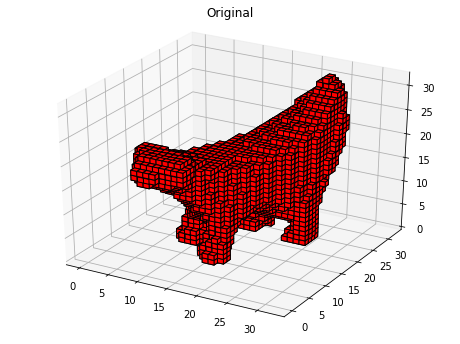

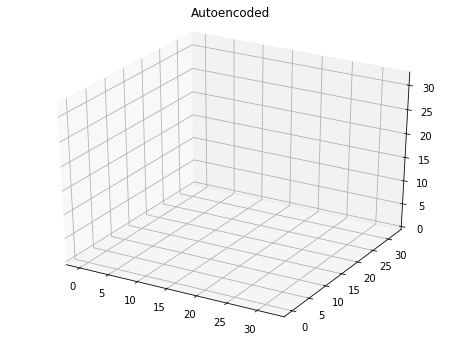

Epoch: 77, Batch: 0, Elapsed time: 48.61 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 77, Batch: 1, Elapsed time: 48.75 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 77, Batch: 2, Elapsed time: 48.89 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 77, Batch: 3, Elapsed time: 49.03 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 78, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

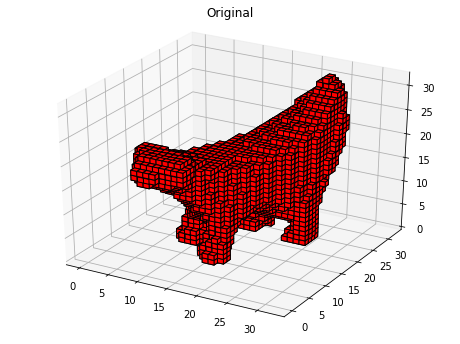

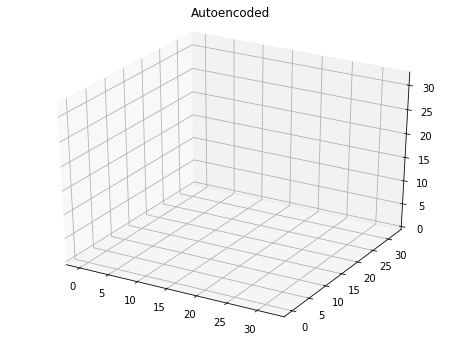

Epoch: 78, Batch: 0, Elapsed time: 49.22 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 78, Batch: 1, Elapsed time: 49.36 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 78, Batch: 2, Elapsed time: 49.50 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 78, Batch: 3, Elapsed time: 49.64 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 79, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

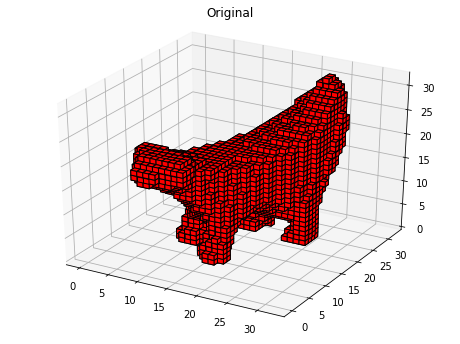

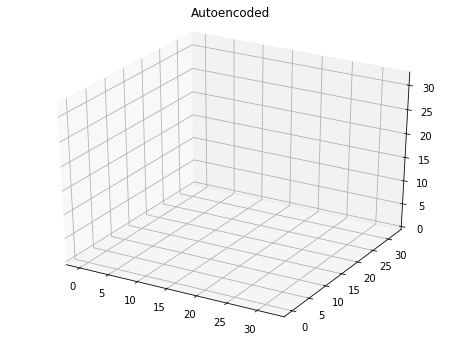

Epoch: 79, Batch: 0, Elapsed time: 49.84 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 79, Batch: 1, Elapsed time: 49.97 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 79, Batch: 2, Elapsed time: 50.11 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 79, Batch: 3, Elapsed time: 50.25 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 80, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

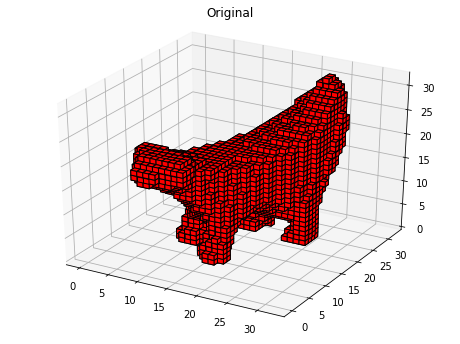

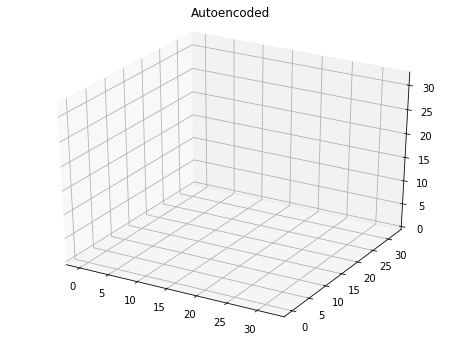

Epoch: 80, Batch: 0, Elapsed time: 50.45 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 80, Batch: 1, Elapsed time: 50.59 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 80, Batch: 2, Elapsed time: 50.73 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 80, Batch: 3, Elapsed time: 50.87 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 81, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

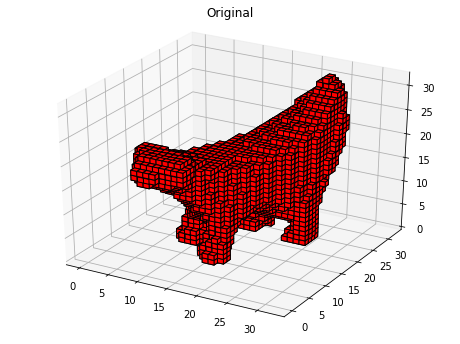

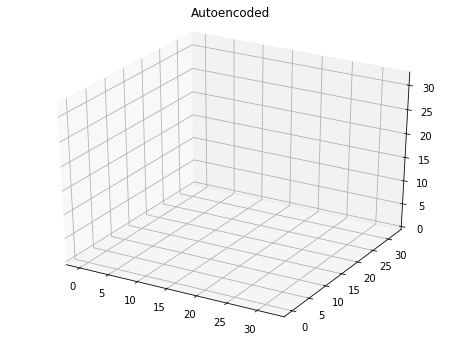

Epoch: 81, Batch: 0, Elapsed time: 51.06 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 81, Batch: 1, Elapsed time: 51.20 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 81, Batch: 2, Elapsed time: 51.34 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 81, Batch: 3, Elapsed time: 51.48 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 82, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

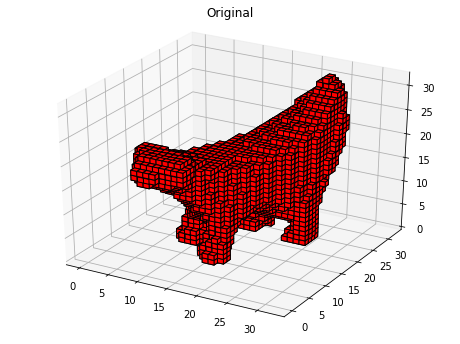

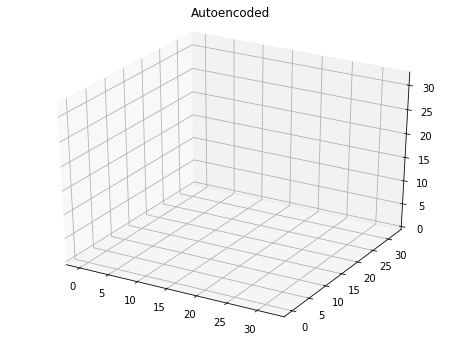

Epoch: 82, Batch: 0, Elapsed time: 51.67 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 82, Batch: 1, Elapsed time: 51.81 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 82, Batch: 2, Elapsed time: 51.95 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 82, Batch: 3, Elapsed time: 52.09 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 83, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

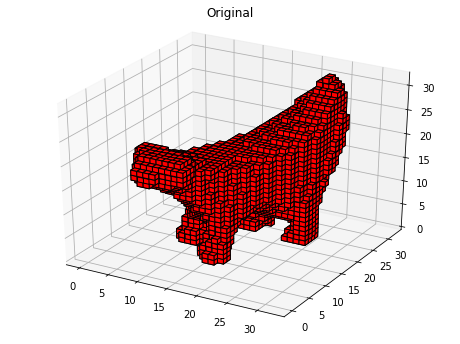

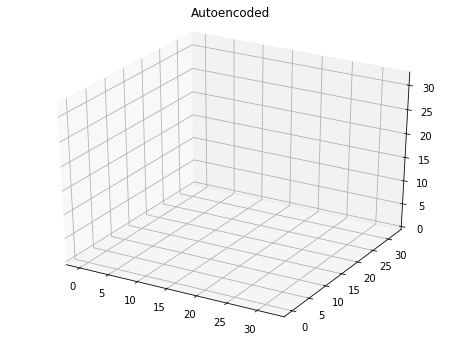

Epoch: 83, Batch: 0, Elapsed time: 52.29 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 83, Batch: 1, Elapsed time: 52.43 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 83, Batch: 2, Elapsed time: 52.57 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 83, Batch: 3, Elapsed time: 52.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 84, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

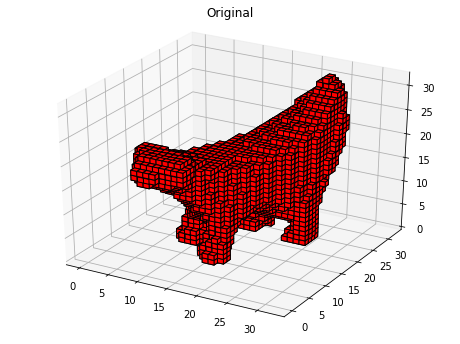

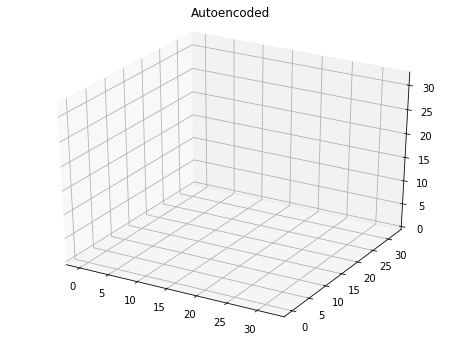

Epoch: 84, Batch: 0, Elapsed time: 52.91 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 84, Batch: 1, Elapsed time: 53.04 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 84, Batch: 2, Elapsed time: 53.18 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 84, Batch: 3, Elapsed time: 53.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 85, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

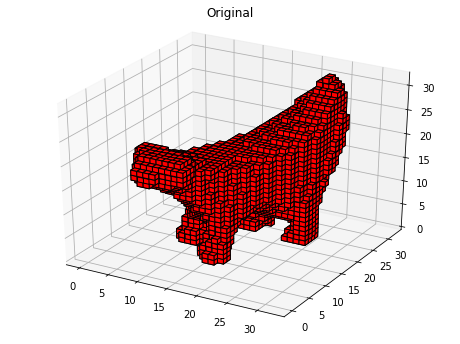

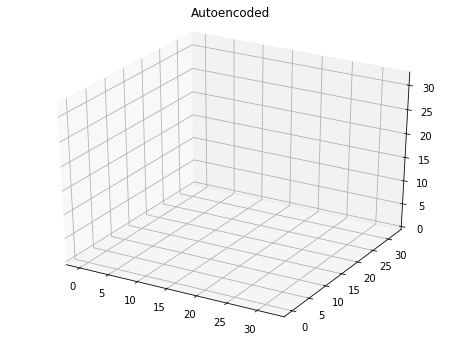

Epoch: 85, Batch: 0, Elapsed time: 53.52 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 85, Batch: 1, Elapsed time: 53.66 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 85, Batch: 2, Elapsed time: 53.80 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 85, Batch: 3, Elapsed time: 53.94 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 86, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

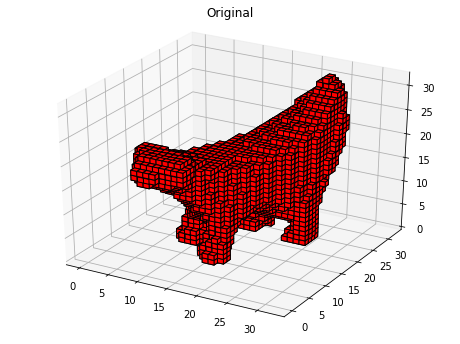

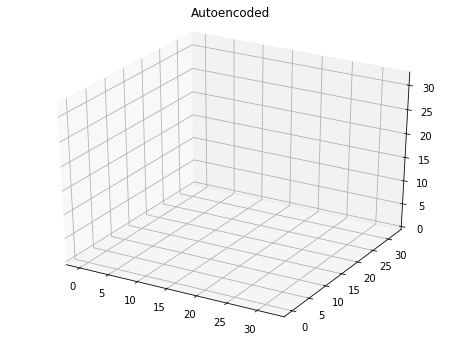

Epoch: 86, Batch: 0, Elapsed time: 54.13 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 86, Batch: 1, Elapsed time: 54.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 86, Batch: 2, Elapsed time: 54.41 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 86, Batch: 3, Elapsed time: 54.56 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 87, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

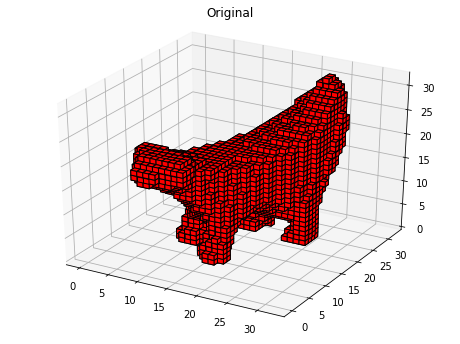

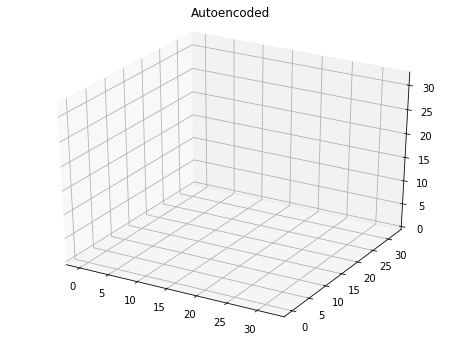

Epoch: 87, Batch: 0, Elapsed time: 54.76 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 87, Batch: 1, Elapsed time: 54.89 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 87, Batch: 2, Elapsed time: 55.03 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 87, Batch: 3, Elapsed time: 55.17 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 88, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

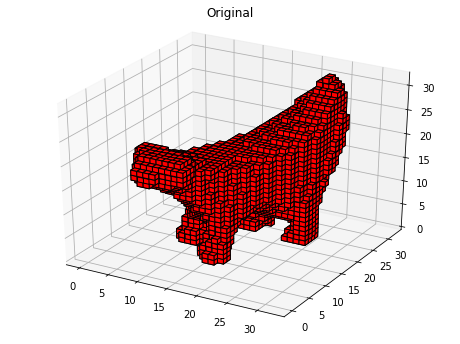

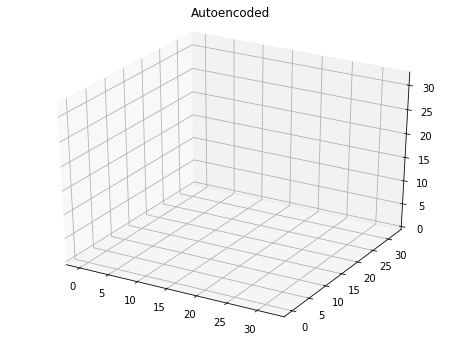

Epoch: 88, Batch: 0, Elapsed time: 55.37 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 88, Batch: 1, Elapsed time: 55.50 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 88, Batch: 2, Elapsed time: 55.65 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 88, Batch: 3, Elapsed time: 55.78 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 89, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

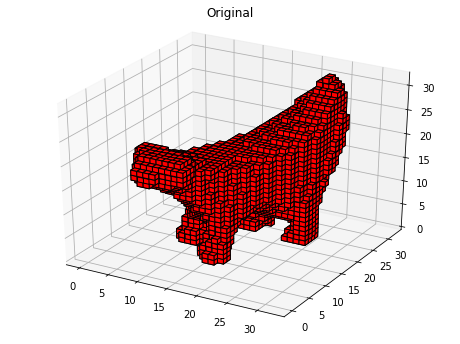

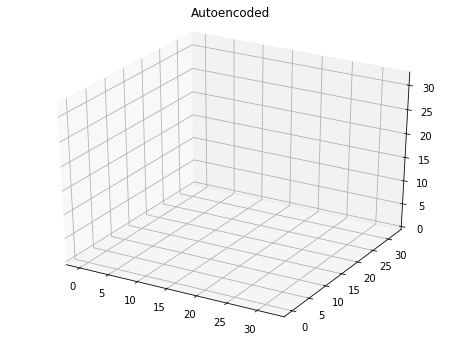

Epoch: 89, Batch: 0, Elapsed time: 55.98 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 89, Batch: 1, Elapsed time: 56.11 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 89, Batch: 2, Elapsed time: 56.25 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 89, Batch: 3, Elapsed time: 56.40 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 90, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

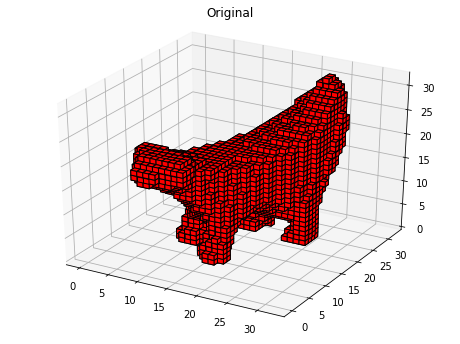

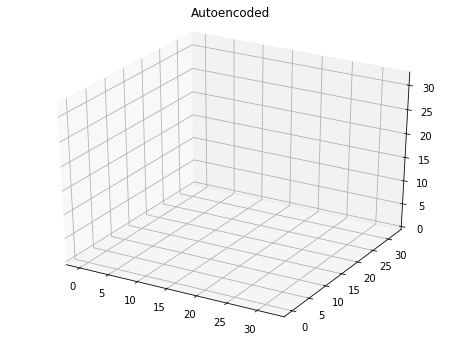

Epoch: 90, Batch: 0, Elapsed time: 56.59 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 90, Batch: 1, Elapsed time: 56.73 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 90, Batch: 2, Elapsed time: 56.87 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 90, Batch: 3, Elapsed time: 57.01 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 91, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

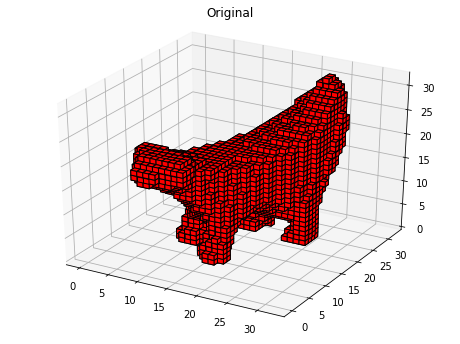

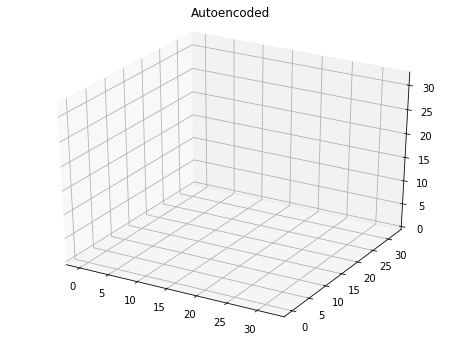

Epoch: 91, Batch: 0, Elapsed time: 57.21 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 91, Batch: 1, Elapsed time: 57.34 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 91, Batch: 2, Elapsed time: 57.48 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 91, Batch: 3, Elapsed time: 57.62 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 92, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

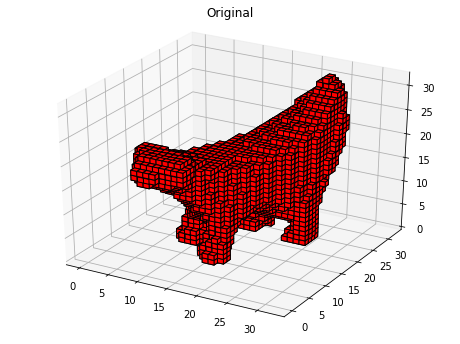

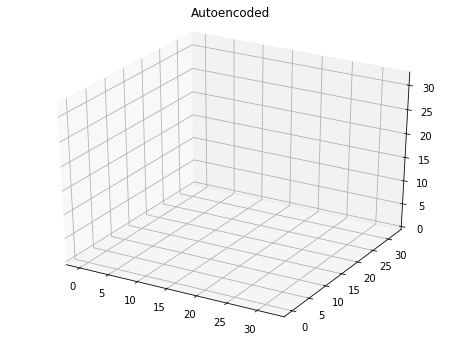

Epoch: 92, Batch: 0, Elapsed time: 57.82 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 92, Batch: 1, Elapsed time: 57.96 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 92, Batch: 2, Elapsed time: 58.10 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 92, Batch: 3, Elapsed time: 58.24 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 93, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

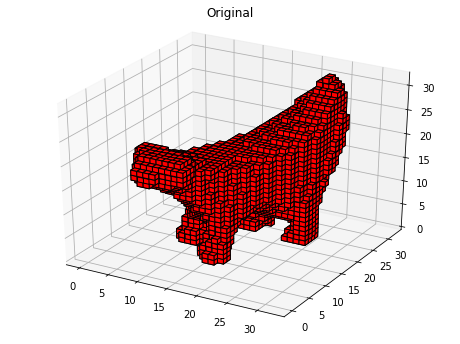

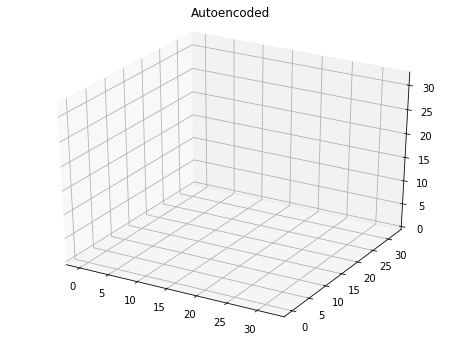

Epoch: 93, Batch: 0, Elapsed time: 58.43 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 93, Batch: 1, Elapsed time: 58.57 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 93, Batch: 2, Elapsed time: 58.71 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 93, Batch: 3, Elapsed time: 58.85 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 94, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

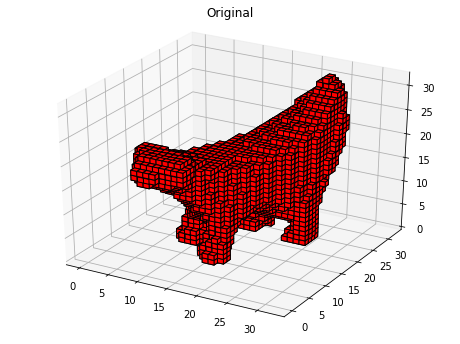

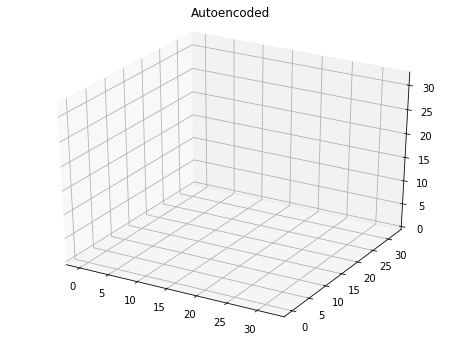

Epoch: 94, Batch: 0, Elapsed time: 59.05 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 94, Batch: 1, Elapsed time: 59.18 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 94, Batch: 2, Elapsed time: 59.32 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 94, Batch: 3, Elapsed time: 59.46 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 95, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

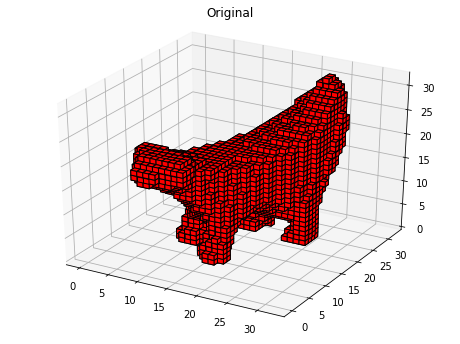

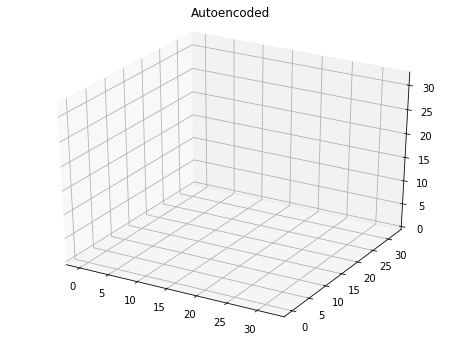

Epoch: 95, Batch: 0, Elapsed time: 59.66 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 95, Batch: 1, Elapsed time: 59.80 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 95, Batch: 2, Elapsed time: 59.94 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 95, Batch: 3, Elapsed time: 60.08 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 96, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

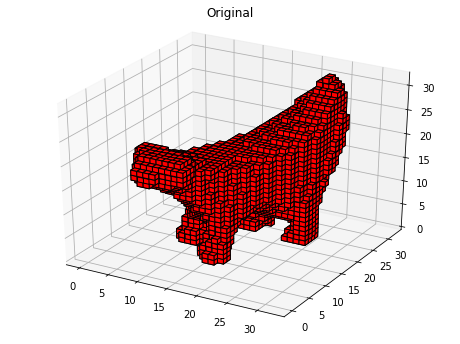

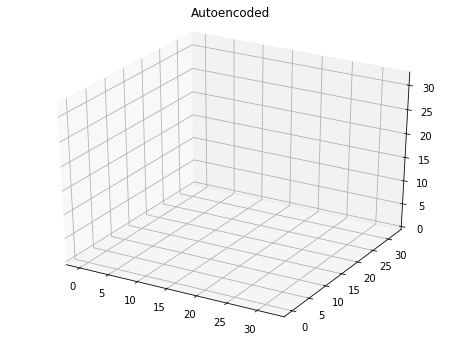

Epoch: 96, Batch: 0, Elapsed time: 60.27 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 96, Batch: 1, Elapsed time: 60.41 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 96, Batch: 2, Elapsed time: 60.55 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 96, Batch: 3, Elapsed time: 60.69 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 97, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

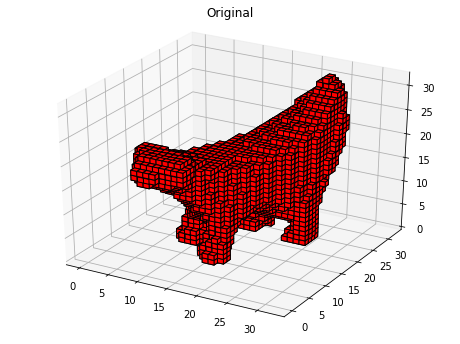

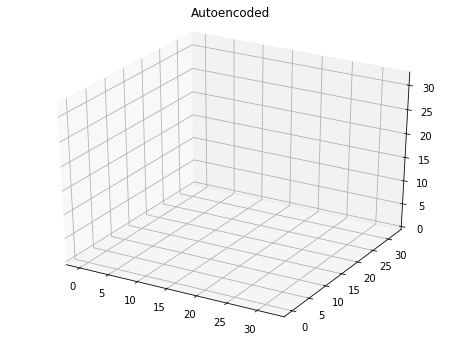

Epoch: 97, Batch: 0, Elapsed time: 60.89 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 97, Batch: 1, Elapsed time: 61.03 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 97, Batch: 2, Elapsed time: 61.17 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 97, Batch: 3, Elapsed time: 61.31 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 98, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

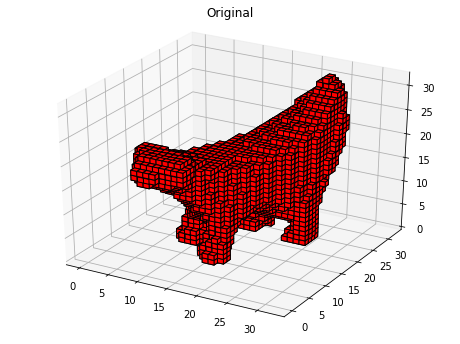

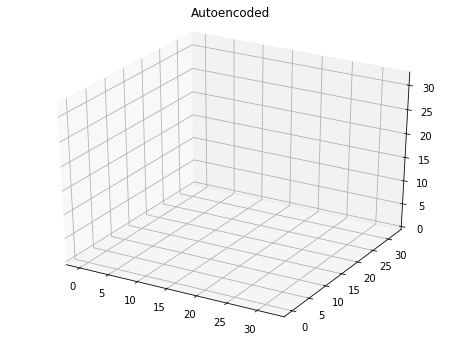

Epoch: 98, Batch: 0, Elapsed time: 61.51 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 98, Batch: 1, Elapsed time: 61.64 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 98, Batch: 2, Elapsed time: 61.78 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 98, Batch: 3, Elapsed time: 61.92 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 99, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss =

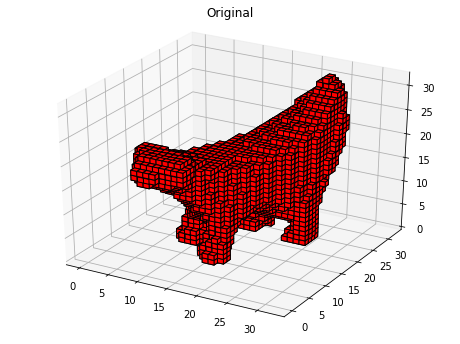

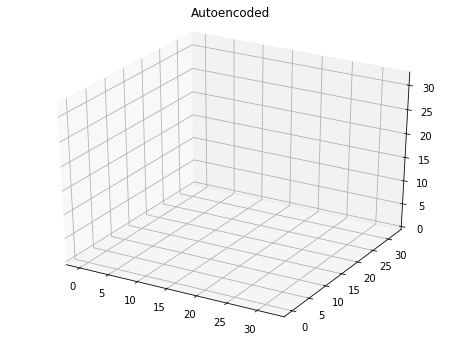

Epoch: 99, Batch: 0, Elapsed time: 62.12 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 99, Batch: 1, Elapsed time: 62.26 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 99, Batch: 2, Elapsed time: 62.40 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 99, Batch: 3, Elapsed time: 62.54 mins
DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan
	KL Divergence = nan, Reconstruction Loss = nan, -D_loss = nan, G_loss = nan
Epoch: 100, Loss = nan, KL Divergence = nan, Reconstruction Loss = nan, -D_Loss 

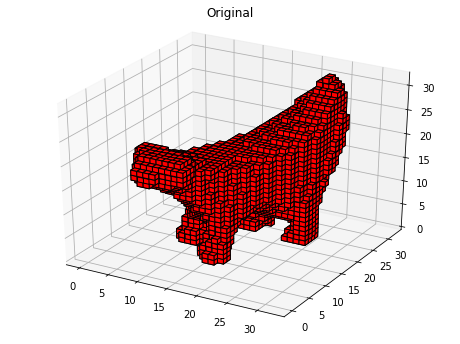

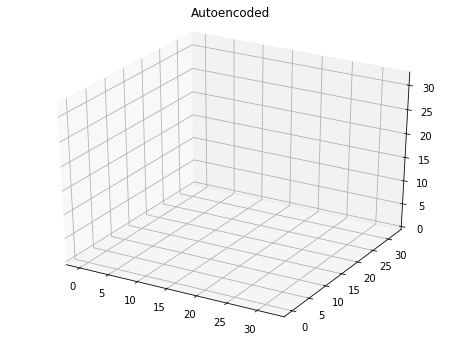

Model saved in path: C:\Users\cynth\desktop\3d-form\src\..\models\voxel_vae\model_epoch-99.ckpt


In [26]:
tf.reset_default_graph()

try:
    vae = VariationalAutoencoder(input_dim=VOXELS_DIM,
                                 latent_dim=100,
                                 learning_rate=0.0001, # 0.00005 for D_lr
                                 keep_prob=1.0,
                                 kl_div_loss_weight=1,
                                 recon_loss_weight=1e4,
                                 verbose=True,
                                 debug=True)

    generator = lambda: thingi.voxels_batchmaker(batch_size=BATCH_SIZE, voxels_dim=VOXELS_DIM, verbose=False)

    vae.train(generator, epochs=100, input_repeats=1, display_step=1, save_step=100,
             viz_data=training_example)
except Exception as exc:
    vae.close()
    raise(exc)

DEBUG_OP "max clipped_output": -inf
DEBUG_OP "min clipped_output": inf
DEBUG_OP "mean clipped_output": nan


C:\Users\cynth\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


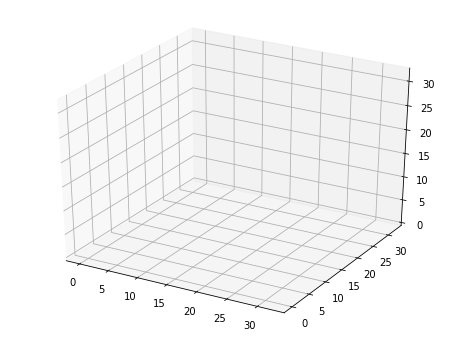

In [27]:
vox_data = thingi.get_voxels(
    VOXELS_DIM,
    stl_file=thingi.get_stl_path(stl_id=101902),
    shape=[-1, VOXELS_DIM, VOXELS_DIM, VOXELS_DIM, 1])
recon = vae.reconstruct(vox_data)
recon = np.reshape(recon, [VOXELS_DIM, VOXELS_DIM, VOXELS_DIM])
recon = recon > 0.09
plot_voxels(recon)

In [24]:
from skimage import measure
output_dir = os.path.join('_output', '3d-vae-gan')
os.makedirs(output_dir, exist_ok=True)
graphs_dir = os.path.join(output_dir, 'graphs')
os.makedirs(graphs_dir, exist_ok=True)

verts, faces, normals, values = measure.marching_cubes_lewiner(recon, 0)
save_vectors_as_stl(verts[faces], os.path.join(graphs_dir, 'vox_vae_gan_output.stl'))

### Insights and Further Tuning
 - 0.1 is a good option for cutoff
 - add clip to discriminator [-0.5, 0.5]
 - use different learning rate/optimization functions for VAE and GAN loss?
 - using smaller learning rate doesn't solve the problem. Perhaps need to check CNN layer parameter.
 - use 64x64x64 as input (Be careful! need to update CNN dimensions!)
 - more iterations
 - latent dimension
 - different data sets
 
 Issues:
 
 1. check the loss function by iteration, change as expected?
 2. after 500 iterations with small data set, total loss is small but the generated object is not good, or worse
 3. inf/-inf loss after many iterations for the animal data of Thingi10k
 4. what does the discriminator output mean [2, 2, 2, 1]?
